# 5. Capstone Project: Exploratory Data Analysis

***

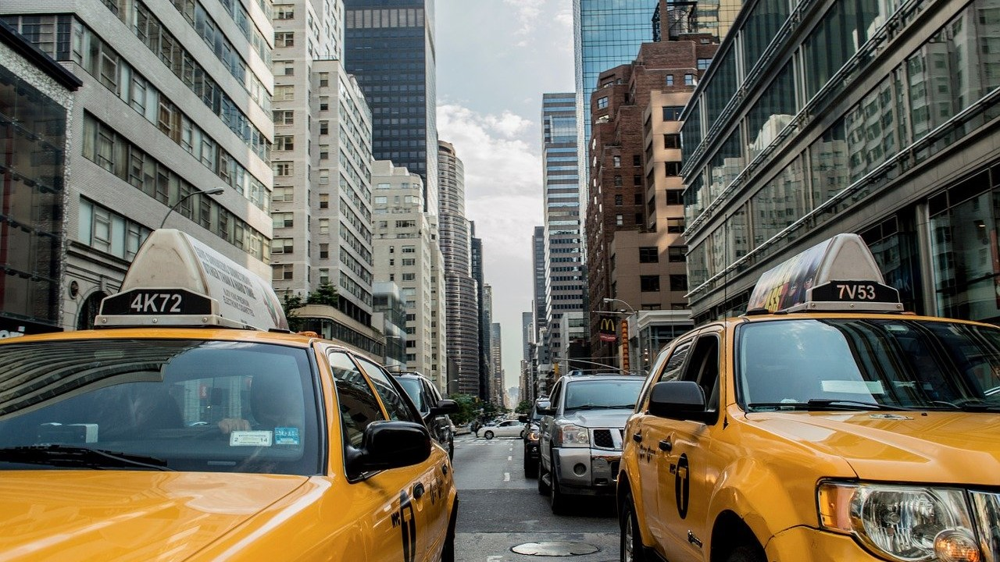

##  Goals

### Project:
Find out where and when traffic congestion is highest and lowest in New York City. Then build different machine learning models that can predict cab travel times in New York City, compare their performance, and explore the potential of additional features such as weather forecasts and holidays to improve the models' predictive performance.

### Section:


## Data
### External Datasets:
- Weather Forecast: The 2018 NYC weather forecast was collected from the [National Weather Service Forecast Office](https://w2.weather.gov/climate/index.php?wfo=okx) website. Daily measurements were taken from January to December 2018 in Central Park. These measures are given in imperial units and include daily minimum and maximum temperatures, precipitations, snowfall, and snow depth.

- Holidays: The 2018 NYC holidays list was collected from the [Office Holiday](https://www.officeholidays.com/countries/usa/new-york/2021) website. The dataset contains the name, date, and type of holidays for New York.

- Taxi Zones: The NYC Taxi Zones dataset was collected from the [NYC Open Data](https://data.cityofnewyork.us/Transportation/NYC-Taxi-Zones/d3c5-ddgc)website. It contains the pickup and drop-off zones (Location IDs) for the Yellow, Green, and FHV Trip Records. The taxi zones are based on the NYC Department of City Planning’s Neighborhood.

### Primary Datasets:

- Taxi Trips: The 2018 NYC Taxi Trip dataset was collected from the [Google Big Query](https://console.cloud.google.com/marketplace/product/city-of-new-york/nyc-tlc-trips?project=jovial-monument-300209&folder=&organizationId=) platform. The dataset contains more than 100'000'000 Yellow Taxi Trip records for 2018 and contains an extensive amount of variables including the pick-up and drop-off dates/times, pick-up and drop-off locations, trip distances, itemized fares, rate types, payment types, and driver-reported passenger counts.

***
## Table of Content:

    1. Data Preparation
        1.1 External Datasets
            1.1.1 Weather Forecast Dataset
            1.1.2 Holidays Dataset
            1.1.3 Taxi Zones Dataset
        1.2 Primary Dataset
            1.2.1 Taxi Trips Dataset
    2. Exploratory Data Analysis
        2.1 Primary Dataset
            2.1.1 Temporal Analysis
            2.1.2 Spatial & Temporal Analysis
        2.2 External Datasets
            2.2.1 Temporal Analysis of weather data 
            2.2.2 Temporal Analysis of holidays data
    3. Machine Learning Models

***
## Python Libraries and Magic commands Import

In [1]:
# Import python core libraries
import itertools

# Import data processing libraries
import numpy as np
import pandas as pd

# Import Visualization librairies
import contextily as ctx
import seaborn as sns
import matplotlib.pyplot as plt

# Import machine learning libraries
from sklearn.model_selection import train_test_split

In [2]:
# Set up magic commands
%matplotlib inline
%config Completer.use_jedi = False

***
## Data Import

In [3]:
# Import the train dataset
train_df = pd.read_pickle(r'data/processed/train_df.pickle')

# Import the test dataset
test_df = pd.read_pickle(r'data/processed/test_df.pickle')

# Import the weather forecasts dataset
weather_df = pd.read_pickle(r'data/processed/weather.pickle')

# Import the holidays dataset
holidays_df = pd.read_pickle(r'data/processed/holidays.pickle')

# Import the zones dataset
zones_df = pd.read_pickle(r'data/processed/zones.pickle')

***
## Variables Import

In [125]:
# List of week days
weekdays = [
    "Monday",
    "Tuesday",
    "Wednesday",
    "Thursday",
    "Friday",
    "Saturday",
    "Sunday",
]

***
## Functions import

In [4]:
# Define a function that transform column headers to titles
def to_title(data, sep="_"):
    return [s.replace(sep, " ").title() for s in data]

In [5]:
# Define a function that display a correlation heatmap
def plot_corrmap(data, figsize=(20, 20), palette="YlGnBu_r"):
    # Create a figure with one column and row
    _, ax =plt.subplots(figsize=figsize)

    # Generate the plot
    sns.heatmap(
        data,
        ax=ax,
        cmap=palette,
        annot=True,
        center=0,
        square=True,
        linewidths=0.5,
        cbar_kws={"shrink": 0.5},
    )

    # Display the figure
    plt.show()

In [6]:
# Define a function that display a heatmap
def plot_heatmap(
    data,
    xticks,
    yticks,
    xlabel,
    ylabel,
    xlim=0,
    figsize=(20, 5),
    palette="YlGnBu_r",
):
    # Create a figure with one column and row
    fig, ax = plt.subplots(figsize=figsize)

    # Generate the plot
    sns.heatmap(data, ax=ax, xticklabels=xticks, yticklabels=yticks, cmap=palette)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_visible(False)
    ax.set_xticklabels(ax.get_xticklabels(), va="center")
    ax.set_yticklabels(ax.get_yticklabels(), va="center")
    ax.tick_params(labelsize=14)
    ax.set_xlabel(xlabel, fontsize=16)
    ax.set_ylabel(ylabel, fontsize=16)
    ax.set_xlim(xlim)
    ax.invert_yaxis()
    ax.grid()

    # Adjust the padding between and around subplots
    fig.tight_layout(pad=0.5, w_pad=0.5)

    # Display the figure
    plt.show()

In [7]:
# Define a function that display individual barplot
def plot_lineplot(
    data,
    x_var,
    y_var,
    xlabel,
    ylabel,
    labels=None,
    label_order=None,
    legend=None,
    figsize=(20, 5),
    palette="YlGnBu",
):
    # Create a figure with one column and row
    fig, ax = plt.subplots(figsize=figsize)

    # Generate the plot
    if labels == None:
        sns.lineplot(x=x_var, y=y_var, data=data, ax=ax, palette=palette)
    else:
        sns.lineplot(
            x=x_var,
            y=y_var,
            hue=labels,
            hue_order=label_order,
            data=data,
            ax=ax,
            palette=palette,
        )
        ax.legend(title=legend)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_visible(False)
    ax.yaxis.set_ticks_position("none")
    ax.tick_params(labelsize=14)
    ax.set_xlabel(xlabel, fontsize=16)
    ax.set_ylabel(ylabel, fontsize=16)
    ax.grid()

    # Adjust the padding between and around subplots
    fig.tight_layout(pad=0.5, w_pad=0.5)

    # Display the figure
    plt.show()

In [8]:
# Define a function that display individual barplot
def plot_barplot(
    data,
    x_var,
    y_var,
    xlabel,
    ylabel,
    labels=None,
    label_order=None,
    legend=None,
    figsize=(20, 5),
    palette="YlGnBu",
):
    # Create a figure with one column and row
    fig, ax = plt.subplots(figsize=figsize)

    # Generate the plot
    if labels == None:
        sns.barplot(x=x_var, y=y_var, data=data, ax=ax, palette=palette)
    else:
        sns.barplot(
            x=x_var,
            y=y_var,
            hue=labels,
            hue_order=label_order,
            data=data,
            ax=ax,
            palette=palette,
        )
        ax.legend(title=legend)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_visible(False)
    ax.yaxis.set_ticks_position("none")
    ax.tick_params(labelsize=14)
    ax.set_xlabel(xlabel, fontsize=16)
    ax.set_ylabel(ylabel, fontsize=16)
    ax.grid()

    # Adjust the padding between and around subplots
    fig.tight_layout(pad=0.5, w_pad=0.5)

    # Display the figure
    plt.show()

In [9]:
# Define a function that display individual barplot
def plot_boxplot(
    data,
    x_var,
    y_var,
    xlabel,
    ylabel,
    figsize=(20, 5),
    palette="YlGnBu",
):
    # Create a figure with one column and row
    fig, ax = plt.subplots(figsize=figsize)

    # Generate the plot
    sns.boxplot(x=x_var, y=y_var, data=data, ax=ax, width=0.5, linewidth=0.75,  palette="YlGnBu")
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_visible(False)
    ax.yaxis.set_ticks_position("none")
    ax.tick_params(labelsize=14)
    ax.set_xlabel(xlabel, fontsize=16)
    ax.set_ylabel(ylabel, fontsize=16)
    ax.grid()

    # Adjust the padding between and around subplots
    fig.tight_layout(pad=0.5, w_pad=0.5)

    # Display the figure
    plt.show()

In [10]:
def plot_clockhist(
    data,
    columns,
    colnames,
    title,
    ylim,
    yticks,
    yticklabels,
    nrows=1,
    ncols=1,
    palette="YlGnBu",
):

    # Get the color palette
    cpal = itertools.cycle(sns.color_palette(palette, len(columns)))

    # Create a figure with n columns and rows
    fig, axes = plt.subplots(
        ncols=ncols,
        nrows=nrows,
        figsize=(5 * ncols, 5 * nrows),
        subplot_kw=dict(projection="polar"),
    )

    # Flatten axes for 2D figures
    if ncols > 1 and nrows > 1:
        axes = axes.ravel()

    # Disable all axes
    for ax in axes:
        ax.set_axis_off()

    # Define theta for 24 hours
    theta = np.linspace(0, 2 * np.pi, 24, endpoint=False)

    # Define the width of each bin
    width = np.divide(np.multiply(2, np.pi), 24)

    # Generate the plots
    for ax, col, colname, color in zip(axes, columns, colnames, cpal):
        ax.bar(
            theta,
            data[col],
            width=width,
            align="edge",
            linewidth=0.25,
            color=color,
            edgecolor="dimgrey",
        )
        ax.set_theta_direction(-1)
        ax.set_theta_zero_location("N")
        ax.set_ylim(0, ylim)
        ax.set_xticks(np.linspace(0, 2 * np.pi, 8, endpoint=False))
        ax.set_yticks(yticks)
        ax.set_xticklabels(
            [f"{x}:00" for x in np.arange(0, 24, 3)],
            rotation="vertical",
            fontsize=12,
        )
        ax.set_yticklabels(
            yticklabels, rotation="vertical", fontsize=12
        )
        ax.set_title(colname, fontsize=16)
        ax.set_axis_on()

    # Adjust the padding between and around subplots
    fig.tight_layout(pad=1, w_pad=1)

    # Adding a title to the plot
    plt.suptitle(title, y=1.10, fontsize=18)

    # Display the plot
    plt.show()

In [11]:
def plot_map(
    data,
    columns,
    colnames,
    nrows=1,
    ncols=1,
    legend=True,
    figsize=(20, 5),
    palette="YlGnBu_r",
):
    # Creat a figure with n rows and one columns
    fig, axes = plt.subplots(
        nrows=nrows,
        ncols=ncols,
        figsize=figsize,
        constrained_layout=True,
        sharex=True,
        sharey=True,
        subplot_kw=dict(aspect="equal"),
    )

    # Get the min from selected columns in the data frame
    vmin = np.min([data[c].min() for c in columns])

    # Get the max from selected columns in the data frame
    vmax = np.max([data[c].max() for c in columns])

    # Flatten axes for 2D figures
    if ncols > 1 and nrows > 1:
        axes = axes.ravel()

    # Disable all axes
    for ax in axes:
        ax.set_axis_off()

    # Generate the plots
    for ax, col, colname in zip(axes, columns, colnames):
        plot = data.plot(
            column=col,
            ax=ax,
            alpha=0.33,
            cmap=sns.color_palette(palette, as_cmap=True),
            edgecolor="k",
            linewidth=0.33,
            vmin=vmin,
            vmax=vmax,
        )
        ax.set_title(colname, fontsize=18)

        # Add a base map of New York City
        ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite)

    # assume it's the first (and only) mappable
    cb = fig.colorbar(
        axes[0].collections[0],
        ax=axes,
        shrink=0.5,
        orientation="horizontal",
    )

    # Display the plot
    plt.show()

***
# 2. Exploratory Data Analysis

## 2.1.1 Temporal Exploratory Data Analysis
### Goal:
Detect and describe patterns, trends, and relationships among temporal features in a subset (1%) of the 2018 NYC yellow cab trip dataset to identify variables that may impact traffic flow, and thus trip duration, in and around New York City.
### Code:

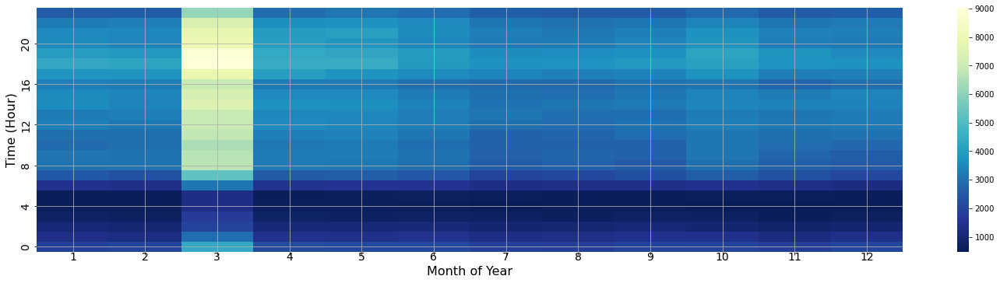

In [12]:
# Group taxi trips by pickup month of year and hour of day
# Compute the number of taxi trips
monthly_rides = (
    train_df.groupby(["pickup_month", "pickup_hour"])
    .size()
    .to_frame("count")
    .reset_index()
)

# Pivot the data frame on the pickup month column
monthly_rides_pvt = monthly_rides.pivot(
    index="pickup_hour", columns="pickup_month", values="count"
)

# Display a heatmap of taxi trips by month of year and day time
plot_heatmap(
    monthly_rides_pvt,
    xticks=1,
    yticks=4,
    xlabel="Month of Year",
    ylabel="Time (Hour)",
)

**Observations:** The heat map above shows the frequency of taxi trips by month and time. The largest increase in the number of trips is observed in March, while the months of July through September, and November through December show a slight decrease compared to the rest of the year. Looking at the hourly scale, we observe that the number of hourly runs starts to decrease rapidly after midnight and increases again around 18:00. The largest daily increase is reached around 19:00.

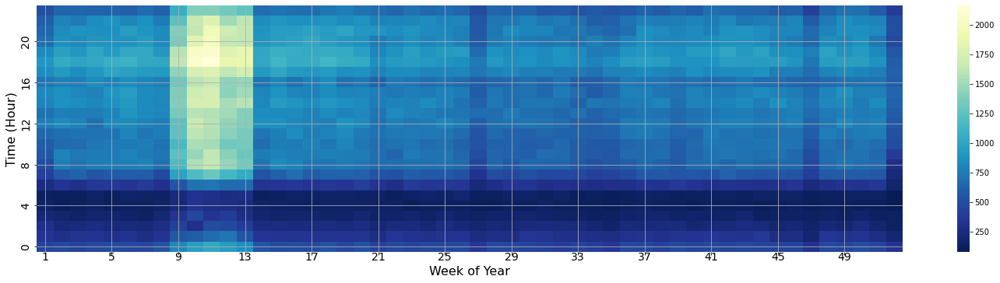

In [13]:
# Group taxi trips by pickup week of year and hour of day
# Compute the number of taxi trips
weekly_rides = (
    train_df.groupby(["pickup_week", "pickup_hour"])
    .size()
    .to_frame("count")
    .reset_index()
)

# Pivot the data frame on the pickup week column
weekly_rides_pvt = weekly_rides.pivot(
    index="pickup_hour", columns="pickup_week", values="count"
)

# Display a heatmap of taxi trips by week of year and time
plot_heatmap(
    weekly_rides_pvt,
    xticks=4,
    yticks=4,
    xlabel="Week of Year",
    ylabel="Time (Hour)",
)

**Observations:** The heat map above shows the frequency of taxi trips by week and time. As previously noted, the largest increase in trips is seen in March and specifically from week 9 to week 13. This increase coincides with the start and end of spring break - a national school vacation whose start and end date depends on the state, but which typically begins in late February and ends in late March. The week following the national holiday of July 14 (week 27), the week of Thanksgiving (week 47), and New Year's Eve (week 53) may also account for some of the slight declines observed in July, November, and December 2018. 

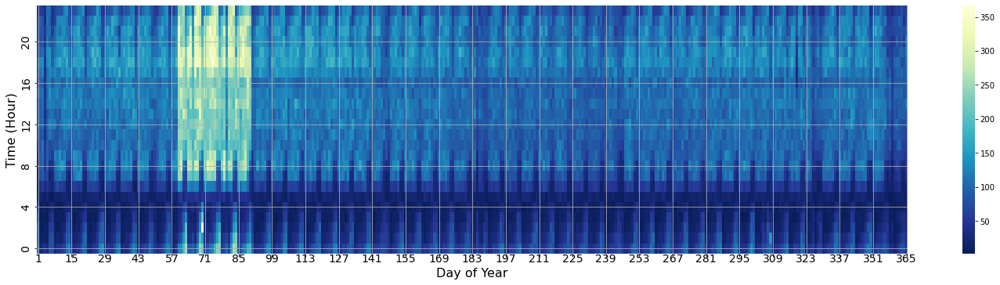

In [14]:
# Group taxi trips by pickup day of year and hour of day
# Compute the number of taxi trips
daily_rides = (
    train_df.groupby(["pickup_yearday", "pickup_hour"])
    .size()
    .to_frame("count")
    .reset_index()
)

# Pivot the data frame on the pickup year day column
daily_rides_pvt = daily_rides.pivot(
    index="pickup_hour", columns="pickup_yearday", values="count"
)

# Display a heatmap of taxi trips by day of year and time
plot_heatmap(
    daily_rides_pvt,
    xticks=14,
    yticks=4,
    xlabel="Day of Year",
    ylabel="Time (Hour)",
)

**Observations:** The heat map above shows the frequency of taxi trips by day and hour. Examination of the data at the daily and hourly scales reveals two different patterns: on weekdays, the number of hourly trips begins to decline rapidly after midnight and increases again around 6:00 a.m., while on weekends, cab trips remain high until 16:00 and decline significantly between 5:00 and 8:00. On weekdays, the largest daily increase is reached around 19:00, while on weekends the number of trips is relatively stable throughout the day and until late at night.

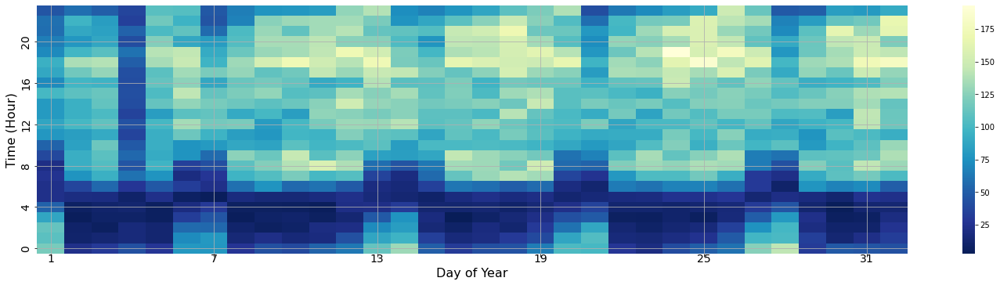

In [15]:
# Display a heatmap of taxi trips by day of year and time for first 31 days of the year
plot_heatmap(
    daily_rides_pvt.iloc[:, 0:32],
    xticks=6,
    yticks=4,
    xlabel="Day of Year",
    ylabel="Time (Hour)",
)

**Observations:** The heat map above shows the frequency of taxi trips by day and hour for the first 31 days of the year. The number of rides appears to drop sharply from Saturday to Sunday. In addition, on January 4, 2018, New York City was hit hard by a powerful cyclonic blizzard, which caused many disruptions.

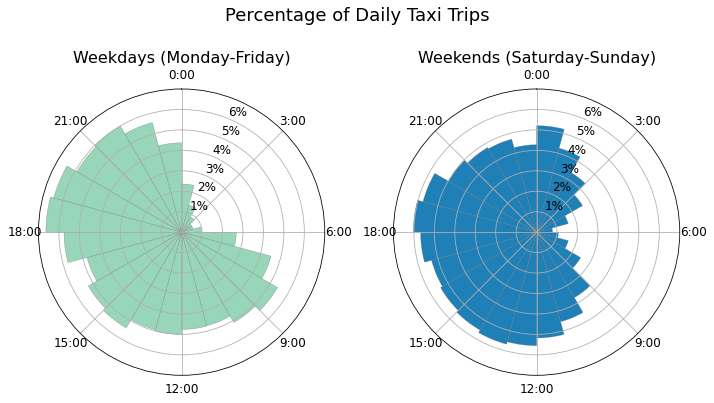

In [151]:
# Group taxi trips by pickup weekday type and hour of day
# Compute the number of taxi trips
hourly_rides = (
    train_df.groupby(["pickup_weekday_type", "pickup_hour"])
    .size()
    .to_frame("count")
    .reset_index()
)

# Get a subset of the data frame where the pickup weekday type is 0 (Weekdays)
hourly_rides_week = hourly_rides.loc[
    hourly_rides["pickup_weekday_type"] == 0, ["pickup_hour", "count"]
]

# Get a subset of the data frame where the pickup weekday type is 1 (Weekends)
hourly_rides_weekend = hourly_rides.loc[
    hourly_rides["pickup_weekday_type"] == 1, ["pickup_hour", "count"]
]

# Compute the percentage of daily ride for each hour of the day (Weekdays)
hourly_rides_week["percent"] = (
    np.divide(hourly_rides_week["count"], hourly_rides_week["count"].sum()) * 100
)

# Compute the percentage of daily ride for each hour of the day (Weekends)
hourly_rides_weekend["percent"] = (
    np.divide(hourly_rides_weekend["count"], hourly_rides_weekend["count"].sum()) * 100
)

# Merge the two data frames into one
hourly_ride_weektype_df = pd.DataFrame(
    {
        "hourly_rides_week": hourly_rides_week["percent"].to_list(),
        "hourly_rides_weekend": hourly_rides_weekend["percent"].to_list(),
    }
)

# Display circular bar plots of the percentage of daily taxi trip per hour and for weekdays and weekends
plot_clockhist(
    hourly_ride_weektype_df,
    columns=["hourly_rides_week", "hourly_rides_weekend"],
    colnames=[
        "Weekdays (Monday-Friday)",
        "Weekends (Saturday-Sunday)",
    ],
    title="Percentage of Daily Taxi Trips",
    ylim=7.0,
    yticks=np.arange(1, 7, 1),
    yticklabels=[f"{y}%" for y in np.arange(1, 7, 1)],
    ncols=2,
)

**Observations:** The circular bar plots above show the percentage of daily taxi trips on weekdays and weekends. On weekdays, the highest peak is reached around 19:00 and decreases sharply after 21:00. Trips between 00:00 and 06:00 are scarce. In contrast, on weekends the percentage of hourly trips seems to be more evenly distributed throughout the day and night, with a sharp increase in the early morning. Trips between 00:00 and 01:00 are almost frequent than between 19:00 and 20:00 and trips between 01:00 and 02:00 are just sligthly less frequent than during the rest of the day.

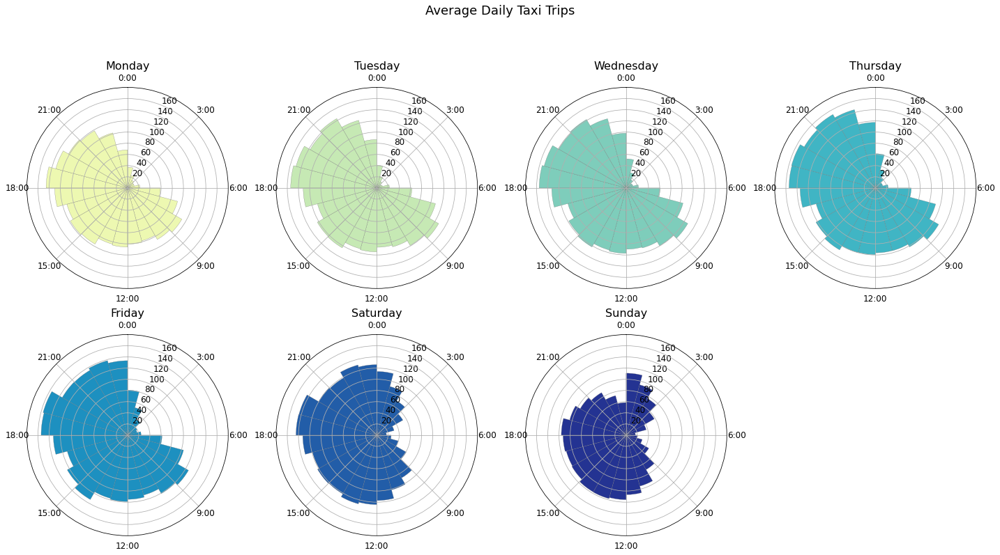

In [147]:
# Group taxi trips by pickup year day, week day, and hour of day
# Compute the number of daily trip
hourly_pickup_count = (
    train_df.groupby(["pickup_yearday", "pickup_weekday", "pickup_hour"])
    .size()
    .to_frame("count")
    .reset_index()
)

# Group taxi trips by pickup weekday, and hour of day
# Compute the average number of daily trips
hourly_pickup_count = (
    hourly_pickup_count.groupby(["pickup_weekday", "pickup_hour"])
    .agg({"count": np.mean})
    .reset_index()
)

# Map numerical values to week days
hourly_pickup_count["pickup_weekday"] = hourly_pickup_count["pickup_weekday"].map(
    dict(zip(np.arange(0, 7), [w.lower() for w in weekdays]))
)

# Pivot the data frame on the pickup week day column
hourly_pickup_count_pvt = hourly_pickup_count.pivot(
    index="pickup_hour", columns="pickup_weekday", values="count"
)


# Display circular bar plots of the average daily taxi trip per hour and for each day of the week
plot_clockhist(
    hourly_pickup_count_pvt,
    columns=[w.lower() for w in weekdays],
    colnames=weekdays,
    title="Average Daily Taxi Trips",
    ylim=180,
    yticks=np.arange(20, 180, 20),
    yticklabels=[f"{y}" for y in np.arange(20, 180, 20)],
    ncols=4,
    nrows=2,
)

**Observations:** The circular bar plots above shows the average number of daily taxi trips for every day of the week. Similar trends are observed from Monday to Friday, but the number of taxi trips increases throughout the week, especially from 6:00 pm to 1:00 am. On Sunday, the number of taxi trips remains stable throughout the day, with a peak between 00:00 and 01:00.  Note that the average number of daily cab trips corresponds to about 0.8% of the total number of trips daily.

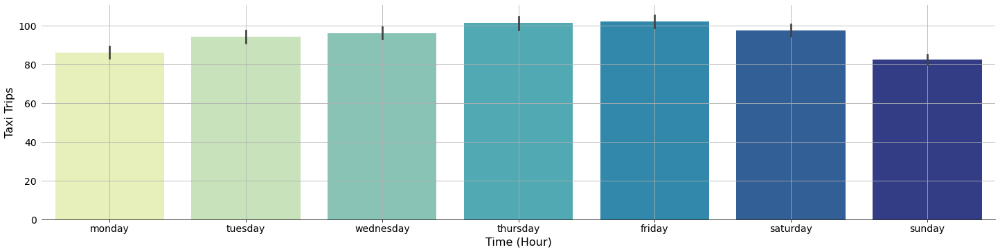

In [149]:
# Group taxi trips by pickup year day, week day, and hour of day
# Compute the number of daily trip
hourly_pickup_count = (
    train_df.groupby(["pickup_yearday", "pickup_weekday", "pickup_hour"])
    .size()
    .to_frame("count")
    .reset_index()
)

# Replace zero counts with NaN to avoid impacting the mean
hourly_pickup_count["count"].replace(0, np.nan, inplace=True)

# Map numerical values to week days
hourly_pickup_count["pickup_weekday"] = hourly_pickup_count["pickup_weekday"].map(
    dict(zip(np.arange(0, 7), [w.lower() for w in weekdays]))
)

# Display a
plot_barplot(
    hourly_pickup_count,
    x_var="pickup_weekday",
    y_var="count",
    labels=None,
    xlabel="Time (Hour)",
    ylabel="Taxi Trips",
)

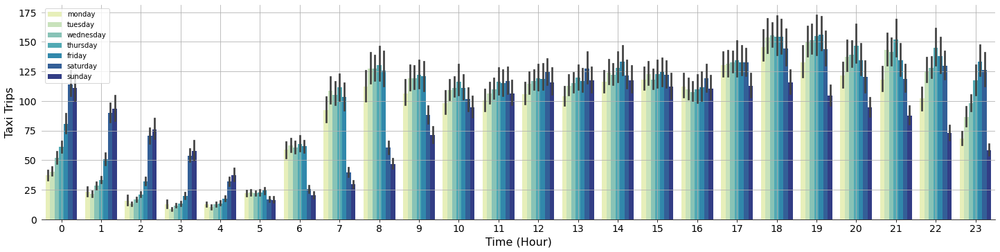

In [150]:
# Display a
plot_barplot(
    hourly_pickup_count,
    x_var="pickup_hour",
    y_var="count",
    labels="pickup_weekday",
    xlabel="Time (Hour)",
    ylabel="Taxi Trips",
)

**Observations:** More taxi ride doesnt mean longer trip duration

In [20]:
# Group taxi trips by pickup year day, month of year, week day, and hour of day
# Compute the mean of trip distrances and durations
hourly_pickup_avg = (
    train_df.groupby(["pickup_yearday", "pickup_month", "pickup_weekday", "pickup_hour"])
    .agg({"trip_distance": np.mean, "trip_duration": np.mean})
    .reset_index()
)

# Compute the average trip speed
hourly_pickup_avg["trip_speed"] = np.divide(
    hourly_pickup_avg["trip_distance"],
    np.divide(hourly_pickup_avg["trip_duration"], 60),
)

# Map numerical values to week days
hourly_pickup_avg["pickup_weekday"] = hourly_pickup_avg["pickup_weekday"].map(
    dict(zip(np.arange(0, 7), [w.lower() for w in weekdays]))
)

# Display descriptive statistics of selected columns
hourly_pickup_avg[["trip_distance", "trip_duration", "trip_speed"]].describe()

,trip_distance,trip_duration,trip_speed
count,8759.000000,8759.000000,8759.000000
mean,4.548055,12.930104,21.925274
std,1.206907,2.460888,7.056311
min,1.051435,3.638889,6.160155
25%,3.767665,11.243202,16.188935
50%,4.262361,12.827083,20.352670
75%,4.979846,14.545594,26.388570
max,15.365174,28.129032,53.943748


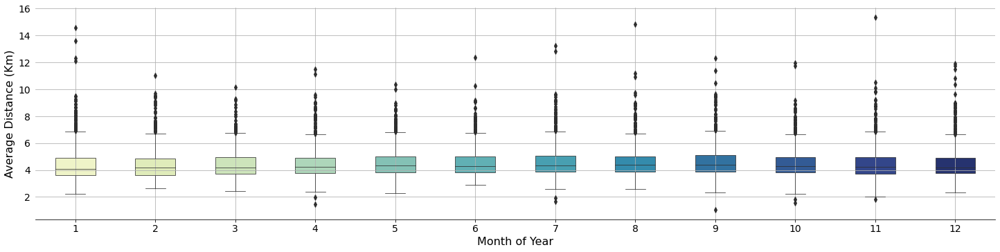

In [24]:
# Display a
plot_boxplot(
    hourly_pickup_avg,
    x_var="pickup_month",
    y_var="trip_distance",
    xlabel="Month of Year",
    ylabel="Average Distance (Km)",
)

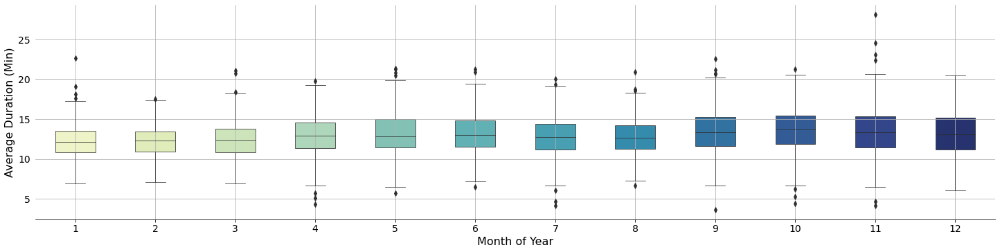

In [25]:
# Display a
plot_boxplot(
    hourly_pickup_avg,
    x_var="pickup_month",
    y_var="trip_duration",
    xlabel="Month of Year",
    ylabel="Average Duration (Min)",
)

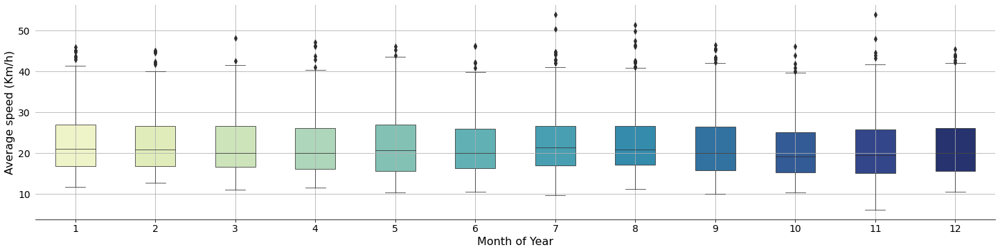

In [26]:
# Display a
plot_boxplot(
    hourly_pickup_avg,
    x_var="pickup_month",
    y_var="trip_speed",
    xlabel="Month of Year",
    ylabel="Average speed (Km/h)",
)

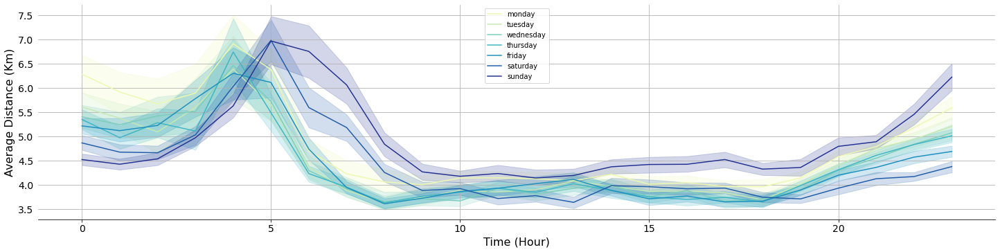

In [21]:
# Display a
plot_lineplot(
    hourly_pickup_avg,
    x_var="pickup_hour",
    y_var="trip_distance",
    labels="pickup_weekday",
    xlabel="Time (Hour)",
    ylabel="Average Distance (Km)",
)

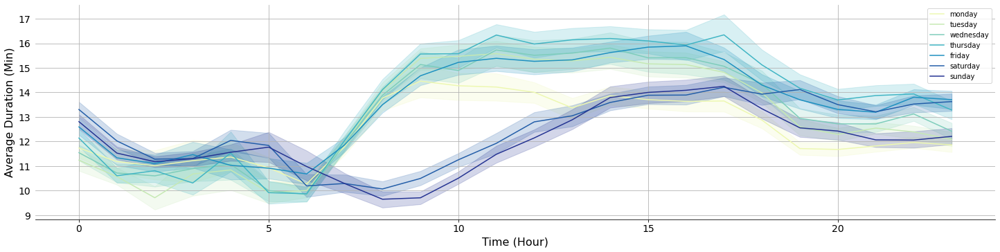

In [22]:
# Display a
plot_lineplot(
    hourly_pickup_avg,
    x_var="pickup_hour",
    y_var="trip_duration",
    labels="pickup_weekday",
    xlabel="Time (Hour)",
    ylabel="Average Duration (Min)",
)

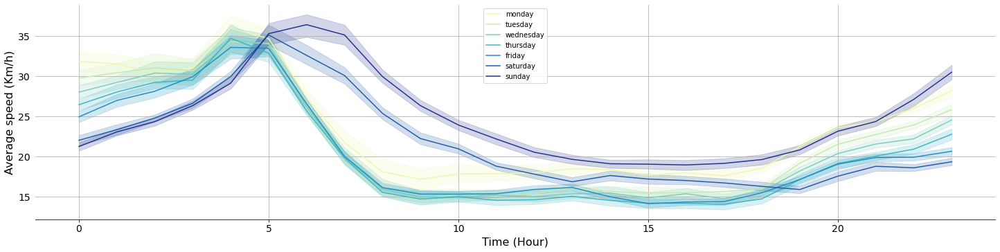

In [23]:
# Display a
plot_lineplot(
    hourly_pickup_avg,
    x_var="pickup_hour",
    y_var="trip_speed",
    labels="pickup_weekday",
    xlabel="Time (Hour)",
    ylabel="Average speed (Km/h)",
)

## 2.2 Exploratory Data Analysis: Spatio-Temporal Time Series
### Goal:
Explore a subset (10%) of the 2018 NYC yellow taxi trip dataset dataset and perform 
### Code:

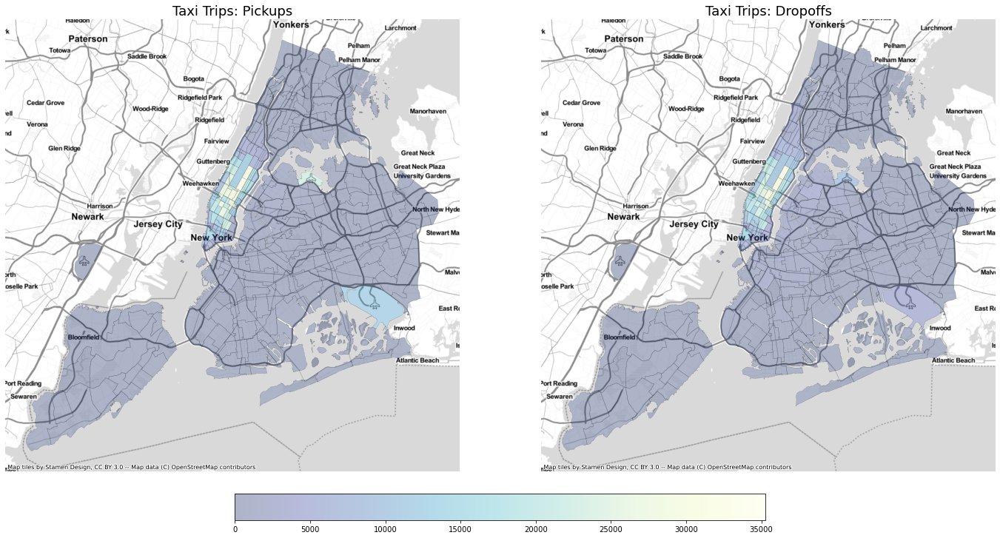

In [27]:
#
total_pickup_count = (
    train_df.groupby(["pickup_location_id"]).size().to_frame("pickup_all").reset_index()
).rename(columns={"pickup_location_id": "LocationID"})

#
total_dropoff_count = (
    train_df.groupby(["dropoff_location_id"])
    .size()
    .to_frame("dropoff_all")
    .reset_index()
).rename(columns={"dropoff_location_id": "LocationID"})

#
zones_summary_df = pd.merge(zones_df, total_pickup_count, how="left", on="LocationID")

#
zones_summary_df = pd.merge(
    zones_summary_df, total_dropoff_count, how="left", on="LocationID"
)

#
zones_summary_df.fillna(0, inplace=True)

#
plot_map(
    zones_summary_df,
    ["pickup_all", "dropoff_all"],
    ["Taxi Trips: Pickups", "Taxi Trips: Dropoffs"],
    ncols=2,
    legend=None,
    figsize=(20, 10),
)

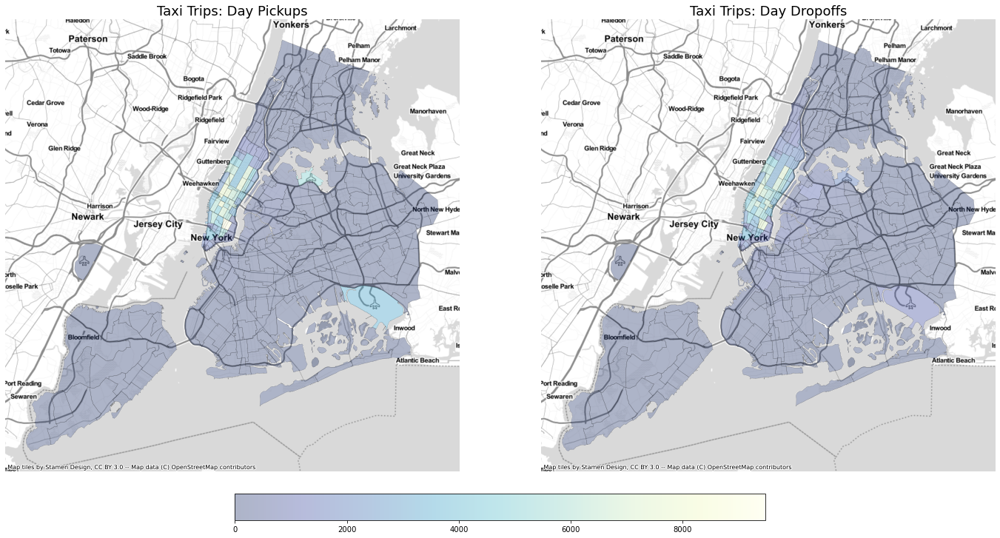

In [28]:
#
total_pickup_count_day = (
    train_df[train_df.pickup_weekday_type == 1]
    .groupby(["pickup_location_id"])
    .size()
    .to_frame("pickup_all_day")
    .reset_index()
).rename(columns={"pickup_location_id": "LocationID"})

#
total_dropoff_count_day = (
    train_df[train_df.pickup_weekday_type == 1]
    .groupby(["dropoff_location_id"])
    .size()
    .to_frame("dropoff_all_day")
    .reset_index()
).rename(columns={"dropoff_location_id": "LocationID"})

#
zones_summary_df = pd.merge(
    zones_df, total_pickup_count_day, how="left", on="LocationID"
)

#
zones_summary_df = pd.merge(
    zones_summary_df, total_dropoff_count_day, how="left", on="LocationID"
)

#
zones_summary_df.fillna(0, inplace=True)

#
plot_map(
    zones_summary_df,
    ["pickup_all_day", "dropoff_all_day"],
    ["Taxi Trips: Day Pickups", "Taxi Trips: Day Dropoffs"],
    ncols=2,
    legend=None,
    figsize=(20, 10),
)

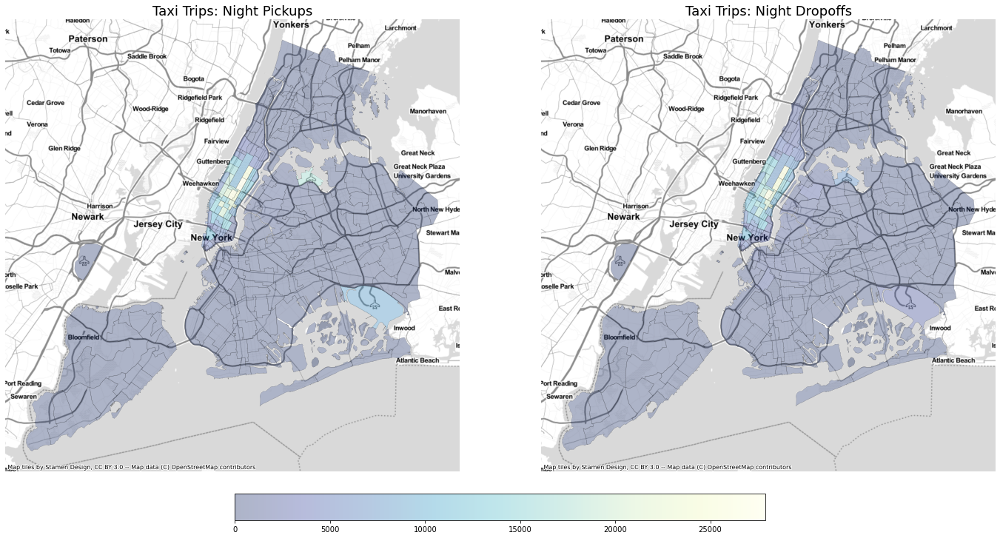

In [29]:
#
total_pickup_count_night = (
    train_df[train_df.pickup_weekday_type == 0]
    .groupby(["pickup_location_id"])
    .size()
    .to_frame("pickup_all_night")
    .reset_index()
).rename(columns={"pickup_location_id": "LocationID"})

#
total_dropoff_count_night = (
    train_df[train_df.pickup_weekday_type == 0]
    .groupby(["dropoff_location_id"])
    .size()
    .to_frame("dropoff_all_night")
    .reset_index()
).rename(columns={"dropoff_location_id": "LocationID"})

#
zones_summary_df = pd.merge(
    zones_df, total_pickup_count_night, how="left", on="LocationID"
)

#
zones_summary_df = pd.merge(
    zones_summary_df, total_dropoff_count_night, how="left", on="LocationID"
)

#
zones_summary_df.fillna(0, inplace=True)

#
plot_map(
    zones_summary_df,
    ["pickup_all_night", "dropoff_all_night"],
    ["Taxi Trips: Night Pickups", "Taxi Trips: Night Dropoffs"],
    ncols=2,
    legend=None,
    figsize=(20, 10),
)

**Observations:**

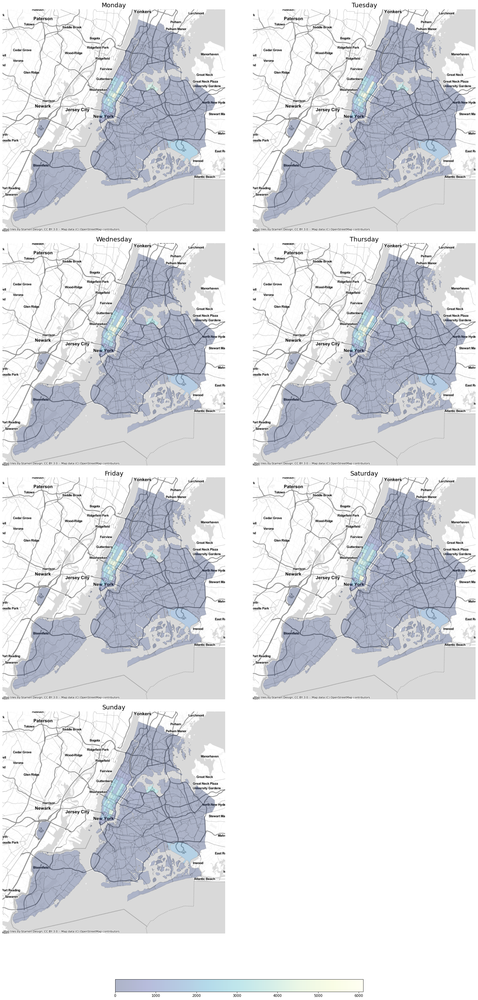

In [30]:
#
daily_pickup_count = (
    train_df.groupby(["pickup_location_id", "pickup_weekday"])
    .size()
    .to_frame("count")
    .reset_index()
)

#
daily_pickup_columns = ["pickup_" + w.lower() for w in weekdays]

#
daily_pickup_count["pickup_weekday"] = daily_pickup_count["pickup_weekday"].map(
    dict(zip(np.arange(0, 7), daily_pickup_columns))
)

# Pivot the daily pickup data frame on the pickup weekday column
daily_pickup_count = daily_pickup_count.pivot(
    index="pickup_location_id", columns="pickup_weekday", values="count"
).reset_index()

# Rename the id column of the daily pickups data frame
daily_pickup_count = daily_pickup_count.rename(
    columns={"pickup_location_id": "LocationID"}
)

# Merge the daily pickups data frame with the zone summary
zones_summary_df = pd.merge(
    zones_summary_df, daily_pickup_count, how="left", on="LocationID"
)

# Fill NaN values in the dataframe with zeros
zones_summary_df.fillna(0, inplace=True)

#
plot_map(
    zones_summary_df,
    daily_pickup_columns,
    weekdays,
    nrows=4,
    ncols=2,
    legend=None,
    figsize=(20, 40),
)

**Observations:**

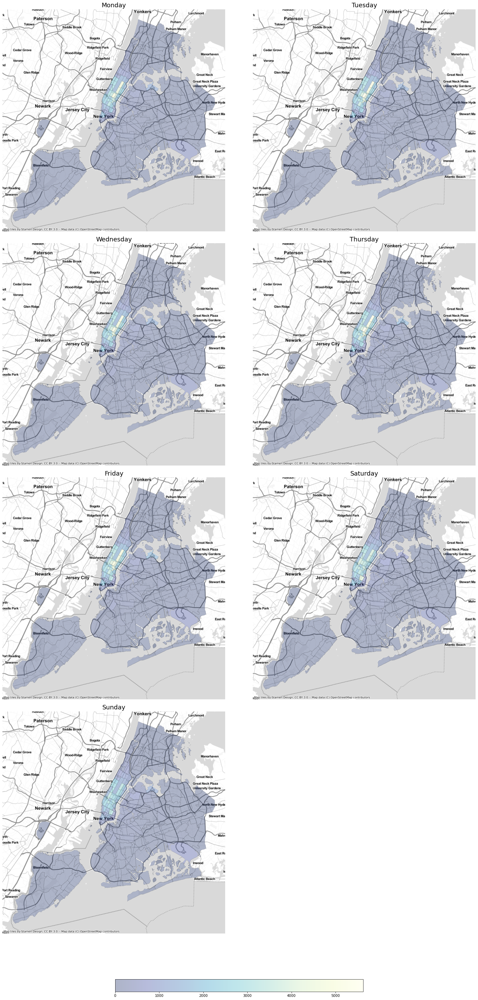

In [31]:
#
daily_dropoff_count = (
    train_df.groupby(["dropoff_location_id", "pickup_weekday"])
    .size()
    .to_frame("count")
    .reset_index()
)

#
daily_dropoff_columns = ["dropoff_" + w.lower() for w in weekdays]

#
daily_dropoff_count["pickup_weekday"] = daily_dropoff_count["pickup_weekday"].map(
    dict(zip(np.arange(0, 7), daily_dropoff_columns))
)

# Pivot the daily pickup data frame on the pickup weekday column
daily_dropoff_count = daily_dropoff_count.pivot(
    index="dropoff_location_id", columns="pickup_weekday", values="count"
).reset_index()

# Rename the id column of the daily pickups data frame
daily_dropoff_count = daily_dropoff_count.rename(
    columns={"dropoff_location_id": "LocationID"}
)

# Merge the daily pickups data frame with the zone summary
zones_summary_df = pd.merge(
    zones_summary_df.copy(), daily_dropoff_count, how="left", on="LocationID"
)

# Fill NA values in the dataframe with zeros
zones_summary_df.fillna(0, inplace=True)

#
plot_map(
    zones_summary_df,
    daily_dropoff_columns,
    weekdays,
    nrows=4,
    ncols=2,
    legend=None,
    figsize=(20, 40),
)

**Observations:**

## borought

In [32]:
# Define the list of boroughs to be used as tick labels
boroughs = ["EWR", "Queens", "Bronx", "Manhattan", "Staten Island", "Brooklyn"]

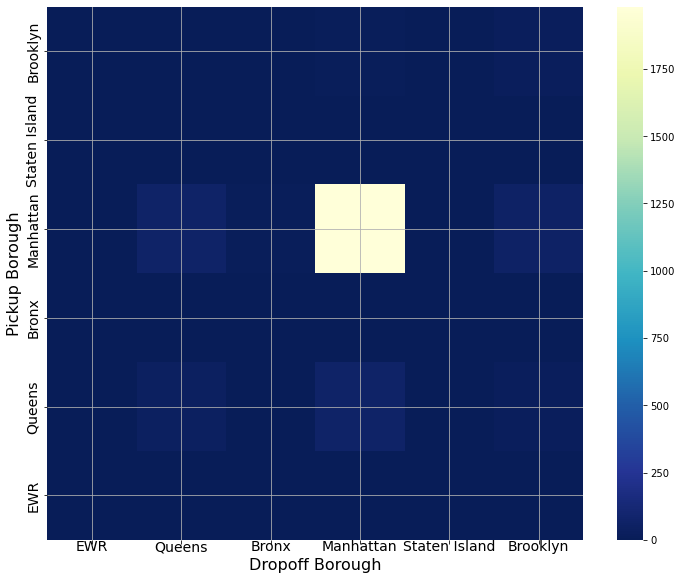

In [33]:
# Group taxi trips by pickup year-day, pickup borough, and dropff borough
# Compute the number of daily trip
pickup_count_borough = (
    train_df.groupby(["pickup_yearday", "pickup_borough_id", "dropoff_borough_id"])
    .size()
    .to_frame("count")
    .reset_index()
)

# Group taxi trips by pickup borough, and dropff borough
# Compute average number of daily trip
pickup_mean_borough = (
    pickup_count_borough.groupby(["pickup_borough_id", "dropoff_borough_id"])
    .agg(mean=("count", "mean"))
    .reset_index()
)

# Pivot the data frame on the droppoff borough column
pickup_count_borough_pvt = pickup_mean_borough.pivot(
    index="pickup_borough_id", columns="dropoff_borough_id", values="mean"
)

# Fill NaN with zeros
pickup_count_borough_pvt.fillna(0, inplace=True)

# Display a heatmap
plot_heatmap(
    pickup_count_borough_pvt,
    xticks=boroughs,
    yticks=boroughs,
    xlabel="Dropoff Borough",
    ylabel="Pickup Borough",
    figsize=(10, 8),
)

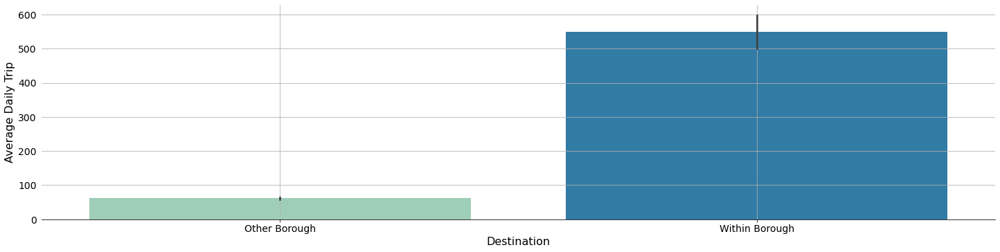

In [34]:
# Group taxi trips by pickup year-day, pickup borough, and within borough indicator
# Compute the number of daily trip
pickup_count_boro_twb = (
    train_df.groupby(["pickup_yearday", "pickup_borough_id", "trip_within_borough"])
    .size()
    .to_frame("count")
    .reset_index()
)

# Replace zero counts with NaN to prevent lowering the average.
pickup_count_boro_twb["count"].replace(0, np.nan, inplace=True)

# Replace numerical values by the name of the categories
pickup_count_boro_twb["trip_within_borough"] = pickup_count_boro_twb[
    "trip_within_borough"
].map(
    dict(
        zip(
            np.arange(0, 2),
            ["Other Borough", "Within Borough"],
        )
    )
)

# Replace numerical values by the name of the categories
pickup_count_boro_twb["pickup_borough_id"] = pickup_count_boro_twb[
    "pickup_borough_id"
].map(
    dict(
        zip(
            np.arange(0, 7),
            boroughs,
        )
    )
)

# Display
plot_barplot(
    pickup_count_boro_twb,
    x_var="trip_within_borough",
    y_var="count",
    labels=None,
    xlabel="Destination",
    ylabel="Average Daily Trip",
)

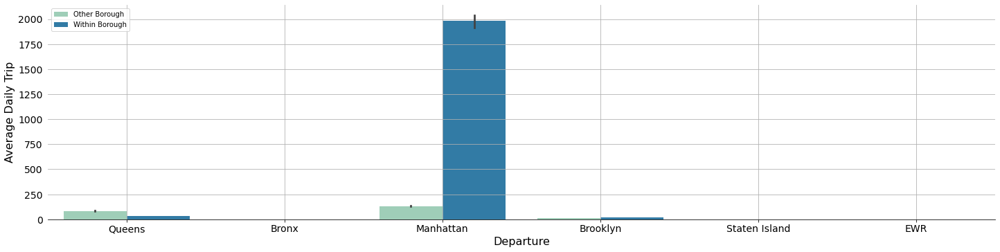

In [35]:
# Display
plot_barplot(
    pickup_count_boro_twb,
    x_var="pickup_borough_id",
    y_var="count",
    labels="trip_within_borough",
    xlabel="Departure",
    ylabel="Average Daily Trip",
)

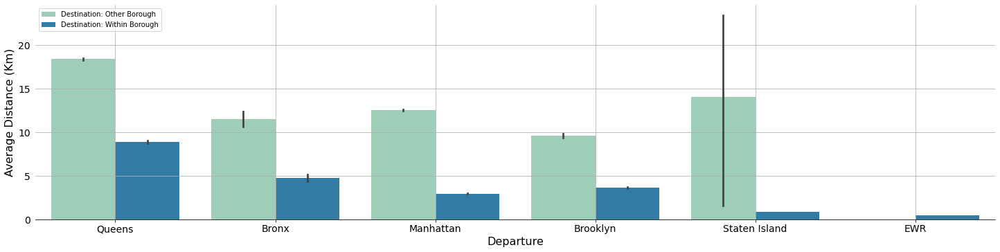

In [36]:
# Group taxi trips by pickup year-day, pickup borough, dropff borough, and within borough trip
# Compute the mean of trip distrances and durations
pickup_avg_boro = (
    train_df.groupby(["pickup_yearday", "pickup_borough_id", "trip_within_borough"])
    .agg({"trip_distance": np.mean, "trip_duration": np.mean})
    .reset_index()
)

# Compute the average trip speed
pickup_avg_boro["trip_speed"] = np.divide(
    pickup_avg_boro["trip_distance"], np.divide(pickup_avg_boro["trip_duration"], 60)
)

# Replace numerical values by the name of the categories
pickup_avg_boro["trip_within_borough"] = pickup_avg_boro["trip_within_borough"].map(
    dict(
        zip(
            np.arange(0, 2),
            ["Destination: Other Borough", "Destination: Within Borough"],
        )
    )
)

# Replace numerical values by the name of the categories
pickup_avg_boro["pickup_borough_id"] = pickup_avg_boro["pickup_borough_id"].map(
    dict(
        zip(
            np.arange(0, 7),
            boroughs,
        )
    )
)

# Display
plot_barplot(
    pickup_avg_boro,
    x_var="pickup_borough_id",
    y_var="trip_distance",
    labels="trip_within_borough",
    xlabel="Departure",
    ylabel="Average Distance (Km)",
)

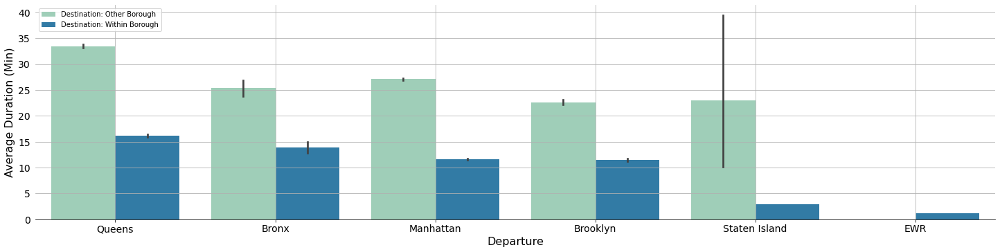

In [37]:
# Display
plot_barplot(
    pickup_avg_boro,
    x_var="pickup_borough_id",
    y_var="trip_duration",
    labels="trip_within_borough",
    xlabel="Departure",
    ylabel="Average Duration (Min)",
)

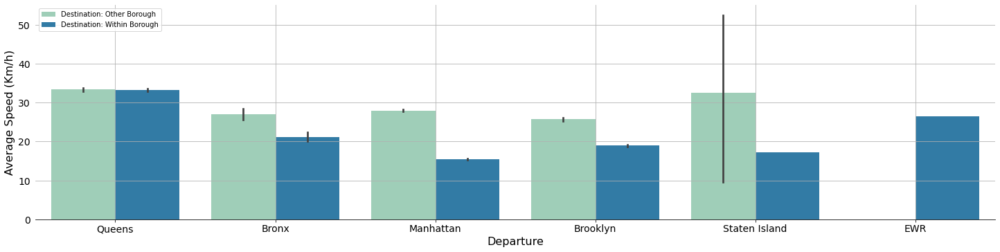

In [38]:
# Display
plot_barplot(
    pickup_avg_boro,
    x_var="pickup_borough_id",
    y_var="trip_speed",
    labels="trip_within_borough",
    xlabel="Departure",
    ylabel="Average Speed (Km/h)",
)

### Toll


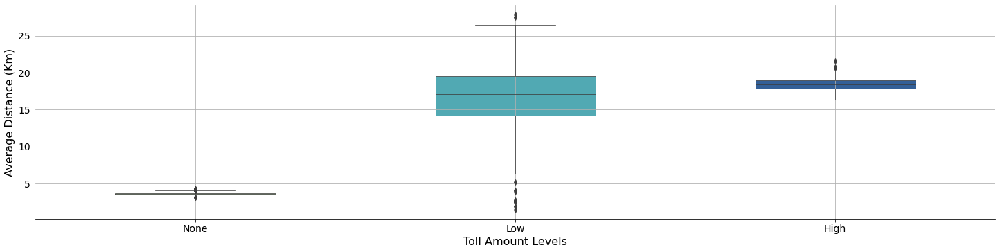

In [39]:
# Group taxi trips by pickup year-day and toll
# Compute the mean of trip distrances and durations
pickup_avg_toll = (
    train_df.groupby(["pickup_yearday", "toll"])
    .agg({"trip_distance": np.mean, "trip_duration": np.mean})
    .reset_index()
)

# Compute the average trip speed
pickup_avg_toll["trip_speed"] = np.divide(
    pickup_avg_toll["trip_distance"], np.divide(pickup_avg_toll["trip_duration"], 60)
)

# Replace numerical values by the name of the categories
pickup_avg_toll["toll"] = pickup_avg_toll["toll"].map(
    dict(zip(np.arange(0, 3), ["None", "Low", "High"]))
)

# Display
plot_boxplot(
    pickup_avg_toll,
    x_var="toll",
    y_var="trip_distance",
    xlabel="Toll Amount Levels",
    ylabel="Average Distance (Km)",
)

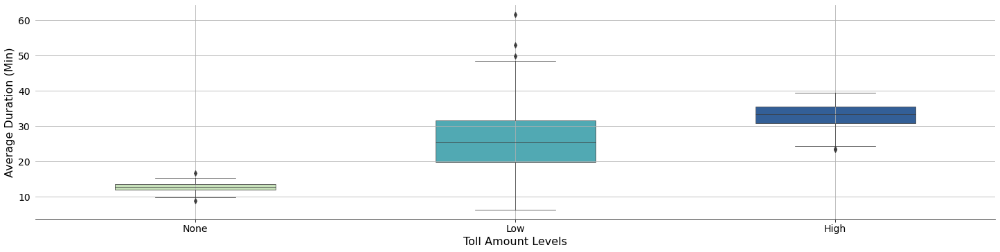

In [40]:
# Display a
plot_boxplot(
    pickup_avg_toll,
    x_var="toll",
    y_var="trip_duration",
    xlabel="Toll Amount Levels",
    ylabel="Average Duration (Min)",
)

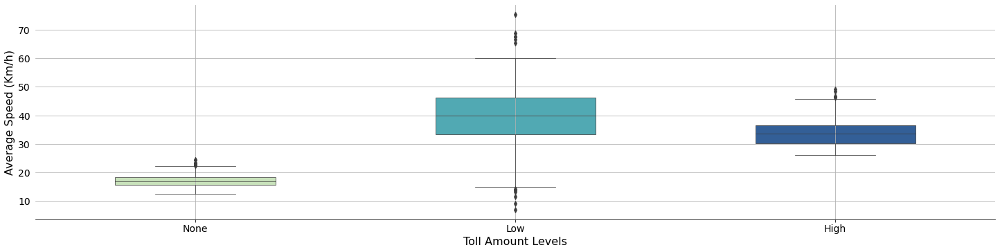

In [41]:
# Display a
plot_boxplot(
    pickup_avg_toll,
    x_var="toll",
    y_var="trip_speed",
    xlabel="Toll Amount Levels",
    ylabel="Average Speed (Km/h)",
)

## External dataset Exploration

## Weather Data: Average Temperature

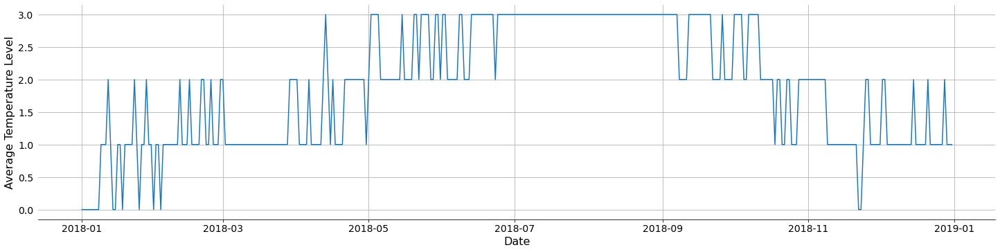

In [42]:
# Display a lineplot of average temperature vs day of year
plot_lineplot(
    weather_df,
    x_var="date",
    y_var="avg_temp",
    labels=None,
    xlabel="Date",
    ylabel="Average Temperature Level",
)

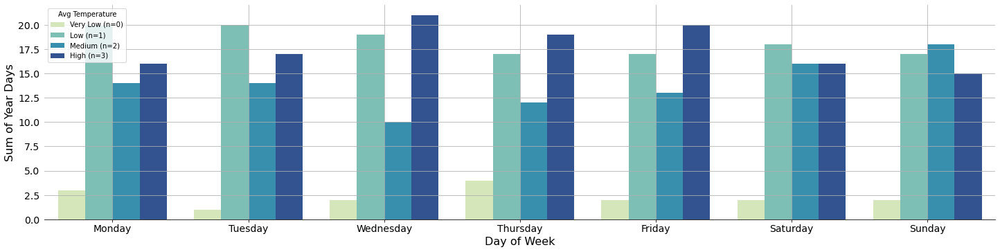

In [43]:
# Add a weekday column to the data frame
weather_df["weekday"] = weather_df["date"].dt.dayofweek

# Group the weather data by weekday and average temperature levels
# Compute the number days with specific average temperatures levels
weather_count_temp = (
    weather_df.groupby(["weekday", "avg_temp"]).size().to_frame("count").reset_index()
)

# Replace numerical values by the name of the categories
weather_count_temp["avg_temp"] = weather_count_temp["avg_temp"].map(
    dict(zip(np.arange(0, 4), ["Very Low (n=0)", "Low (n=1)", "Medium (n=2)", "High (n=3)"]))
)

# Replace numerical values by the name of the categories
weather_count_temp["weekday"] = weather_count_temp["weekday"].map(
    dict(zip(np.arange(0, 7), weekdays))
)

# Display a barplot of week days vs number of year days for all temperature levels
plot_barplot(
    weather_count_temp,
    x_var="weekday",
    y_var="count",
    labels="avg_temp",
    xlabel="Day of Week",
    ylabel="Sum of Year Days",
    legend="Avg Temperature",
)

In [44]:
# Group taxi trips by pickup year-day, week-day, hour, and average temperature
# Compute the number of daily trip
pickup_count_temp = (
    train_df.groupby(["pickup_yearday", "pickup_weekday", "pickup_hour", "avg_temp"])
    .size()
    .to_frame("count")
    .reset_index()
)

# Replace zero counts with NaN to prevent lowering the average.
pickup_count_temp["count"].replace(0, np.nan, inplace=True)

# Replace numerical values by the name of the categories
pickup_count_temp["avg_temp"] = pickup_count_temp["avg_temp"].map(
    dict(zip(np.arange(0, 4), ["Very Low", "Low", "Medium", "High"]))
)

# Replace numerical values by the name of the categories
pickup_count_temp["pickup_weekday"] = pickup_count_temp["pickup_weekday"].map(
    dict(zip(np.arange(0, 7), weekdays))
)

# Display the first five rows of the data frame
pickup_count_temp.head()

,pickup_yearday,pickup_weekday,pickup_hour,avg_temp,count
0,1,Monday,0,Very Low,119
1,1,Monday,1,Very Low,108
2,1,Monday,2,Very Low,112
3,1,Monday,3,Very Low,87
4,1,Monday,4,Very Low,52


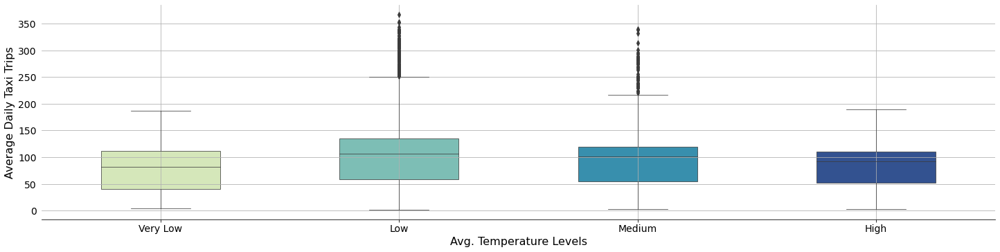

In [45]:
# Display a barplot of average daily taxi trips vs average temperature levels
plot_boxplot(
    pickup_count_temp,
    x_var="avg_temp",
    y_var="count",
    xlabel="Avg. Temperature Levels",
    ylabel="Average Daily Taxi Trips",
)

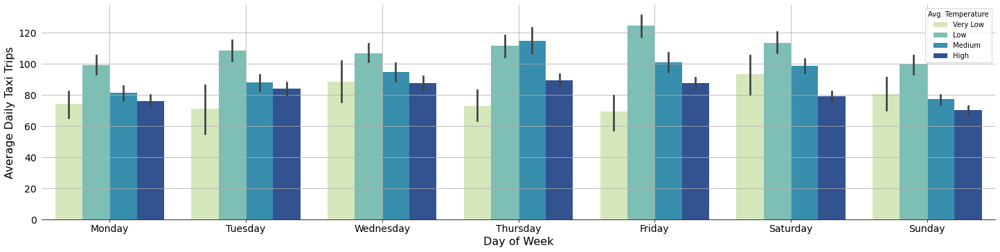

In [46]:
# Display a barplot of average daily taxi trips vs day of week for all average temperature levels
plot_barplot(
    pickup_count_temp,
    x_var="pickup_weekday",
    y_var="count",
    labels="avg_temp",
    xlabel="Day of Week",
    ylabel="Average Daily Taxi Trips",
    legend="Avg. Temperature",
)

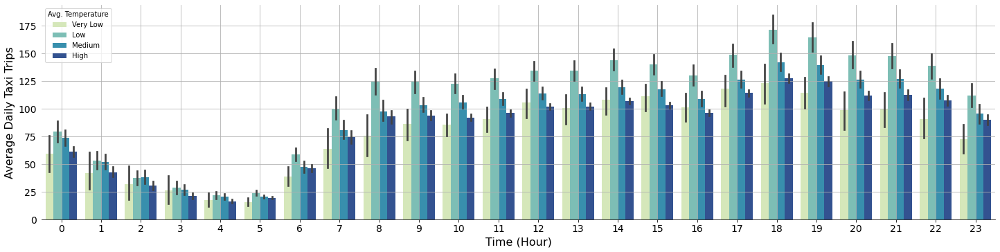

In [47]:
# Display a barplot of average daily taxi trips vs hour of day for all average temperature levels
plot_barplot(
    pickup_count_temp,
    x_var="pickup_hour",
    y_var="count",
    labels="avg_temp",
    xlabel="Time (Hour)",
    ylabel="Average Daily Taxi Trips",
    legend="Avg. Temperature"
)

In [48]:
# Group taxi trips by pickup year-day, week-day, hour, and average temperature levels
# Compute the mean of trip distrances and durations
pickup_avg_temp = (
    train_df.groupby(["pickup_yearday", "pickup_weekday", "pickup_hour", "avg_temp"])
    .agg({"trip_distance": np.mean, "trip_duration": np.mean})
    .reset_index()
)

# Compute the average trip speed
pickup_avg_temp["trip_speed"] = np.divide(
    pickup_avg_temp["trip_distance"], np.divide(pickup_avg_temp["trip_duration"], 60)
)

# Replace numerical values by the name of the categories
pickup_avg_temp["avg_temp"] = pickup_avg_temp["avg_temp"].map(
    dict(zip(np.arange(0, 4), ["Very Low", "Low", "Medium", "High"]))
)

# Replace numerical values by the name of the categories
pickup_avg_temp["pickup_weekday"] = pickup_avg_temp["pickup_weekday"].map(
    dict(zip(np.arange(0, 7), weekdays))
)

# Display descriptive statistics of selected columns
pickup_avg_temp[["trip_distance", "trip_duration", "trip_speed"]].describe()

,trip_distance,trip_duration,trip_speed
count,8759.000000,8759.000000,8759.000000
mean,4.548055,12.930104,21.925274
std,1.206907,2.460888,7.056311
min,1.051435,3.638889,6.160155
25%,3.767665,11.243202,16.188935
50%,4.262361,12.827083,20.352670
75%,4.979846,14.545594,26.388570
max,15.365174,28.129032,53.943748


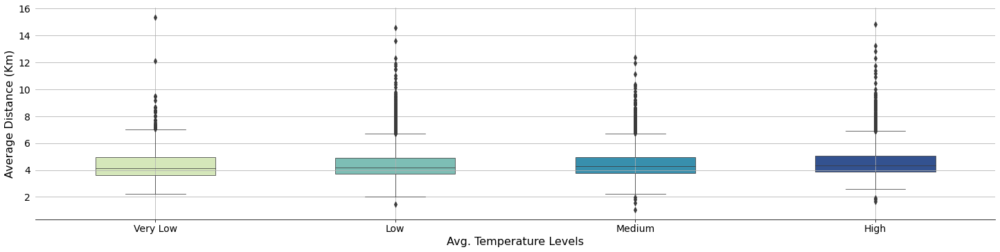

In [49]:
# Display a boxplot of average trip distance vs average temperature levels
plot_boxplot(
    pickup_avg_temp,
    x_var="avg_temp",
    y_var="trip_distance",
    xlabel="Avg. Temperature Levels",
    ylabel="Average Distance (Km)",
)

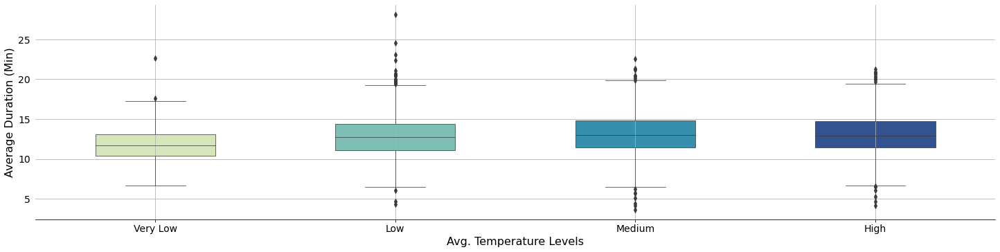

In [50]:
# Display a boxplot of average trip duration vs average temperature levels
plot_boxplot(
    pickup_avg_temp,
    x_var="avg_temp",
    y_var="trip_duration",
    xlabel="Avg. Temperature Levels",
    ylabel="Average Duration (Min)",
)

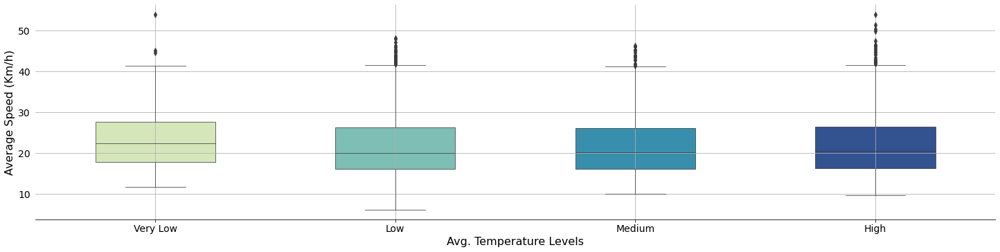

In [51]:
# Display a boxplot of average trip speed vs average temperature levels
plot_boxplot(
    pickup_avg_temp,
    x_var="avg_temp",
    y_var="trip_speed",
    xlabel="Avg. Temperature Levels",
    ylabel="Average Speed (Km/h)",
)

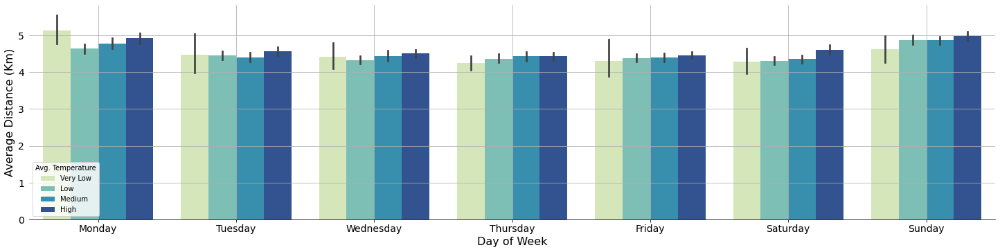

In [52]:
# Display a barplot of average trip distance vs day of week for all average temperature levels
plot_barplot(
    pickup_avg_temp,
    x_var="pickup_weekday",
    y_var="trip_distance",
    labels="avg_temp",
    xlabel="Day of Week",
    ylabel="Average Distance (Km)",
    legend="Avg. Temperature",
)

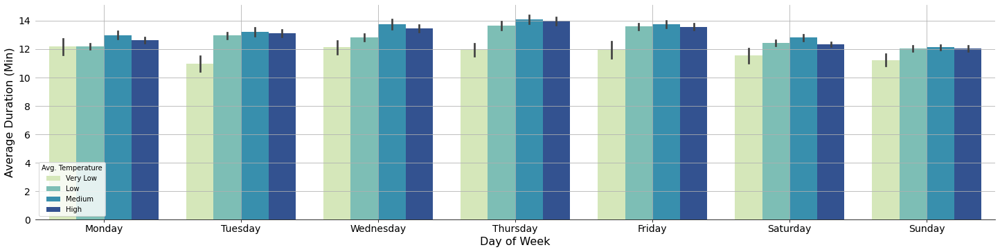

In [53]:
# Display a barplot of average trip duration vs hour of day for all average temperature levels
plot_barplot(
    pickup_avg_temp,
    x_var="pickup_weekday",
    y_var="trip_duration",
    labels="avg_temp",
    xlabel="Day of Week",
    ylabel="Average Duration (Min)",
    legend="Avg. Temperature",
)

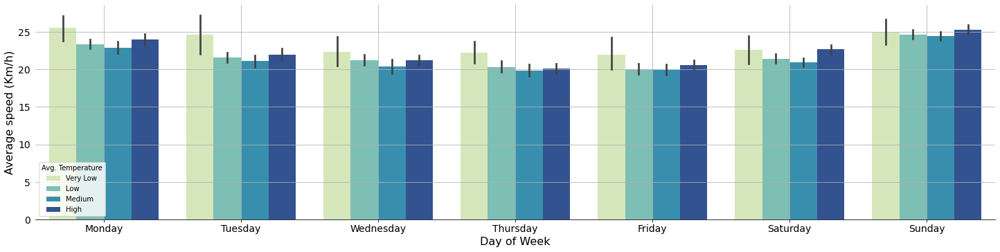

In [54]:
# Display a barplot of average trip duration vs hour of day for all average temperature levels
plot_barplot(
    pickup_avg_temp,
    x_var="pickup_weekday",
    y_var="trip_speed",
    labels="avg_temp",
    xlabel="Day of Week",
    ylabel="Average speed (Km/h)",
    legend="Avg. Temperature",
)

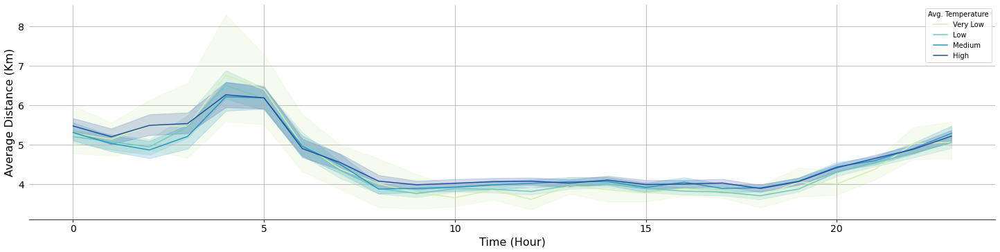

In [55]:
# Display a lineplot of average trip distance vs hour of day for all average temperature levels
plot_lineplot(
    pickup_avg_temp,
    x_var="pickup_hour",
    y_var="trip_distance",
    labels="avg_temp",
    xlabel="Time (Hour)",
    ylabel="Average Distance (Km)",
    legend="Avg. Temperature",
)

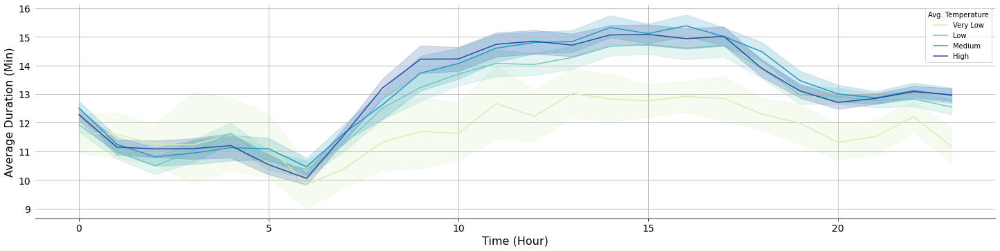

In [56]:
# Display a lineplot of average trip duration vs hour of day for all average temperature levels
plot_lineplot(
    pickup_avg_temp,
    x_var="pickup_hour",
    y_var="trip_duration",
    labels="avg_temp",
    xlabel="Time (Hour)",
    ylabel="Average Duration (Min)",
    legend="Avg. Temperature",
)

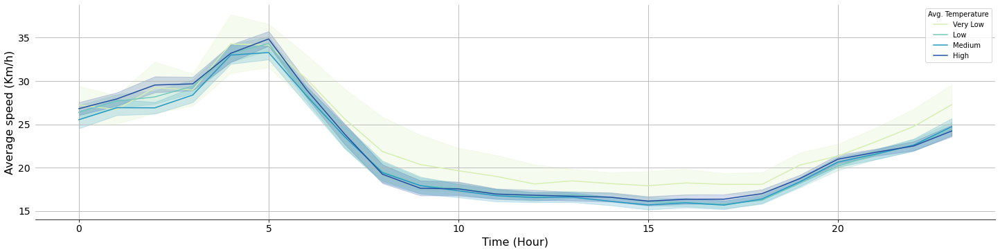

In [57]:
# Display a lineplot of average trip duration vs hour of day for all average temperature levels
plot_lineplot(
    pickup_avg_temp,
    x_var="pickup_hour",
    y_var="trip_speed",
    labels="avg_temp",
    xlabel="Time (Hour)",
    ylabel="Average speed (Km/h)",
    legend="Avg. Temperature",
)

## Weather Dataset: Precipitations

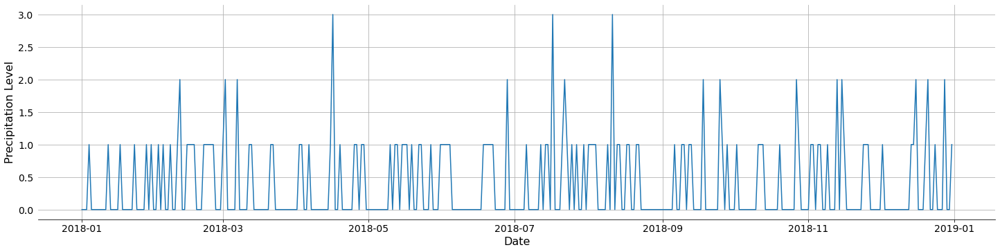

In [58]:
# Display a lineplot of precipitation vs day of year
plot_lineplot(
    weather_df,
    x_var="date",
    y_var="prec",
    labels=None,
    xlabel="Date",
    ylabel="Precipitation Level",
)

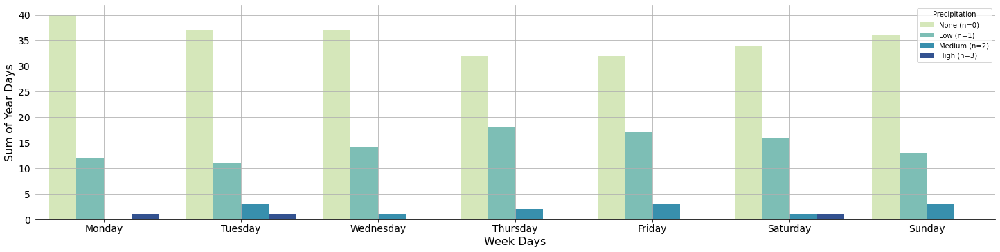

In [59]:
# Group the weather data by weekday and precipitation levels
# Compute the number days with specific precipitation levels
weather_count_prec = (
    weather_df.groupby(["weekday", "prec"]).size().to_frame("count").reset_index()
).sort_values(["weekday", "prec"])

# Replace numerical values by the name of the categories
weather_count_prec["prec"] = weather_count_prec["prec"].map(
    dict(
        zip(np.arange(0, 4), ["None (n=0)", "Low (n=1)", "Medium (n=2)", "High (n=3)"])
    )
)

# Replace numerical values by the name of the categories
weather_count_prec["weekday"] = weather_count_prec["weekday"].map(
    dict(zip(np.arange(0, 7), weekdays))
)

# Display a barplot of week days vs sum of year days for all precipitation levels
plot_barplot(
    weather_count_prec,
    x_var="weekday",
    y_var="count",
    labels="prec",
    xlabel="Week Days",
    ylabel="Sum of Year Days",
    legend="Precipitation",
    label_order=["None (n=0)", "Low (n=1)", "Medium (n=2)", "High (n=3)"],
)

In [60]:
# Group taxi trips by pickup year-day, week-day, hour, and precipitation levels
# Compute the number of daily trip
pickup_count_prec = (
    train_df.groupby(["pickup_yearday", "pickup_weekday", "pickup_hour", "prec"])
    .size()
    .to_frame("count")
    .reset_index()
)

# Replace zero counts with NaN to prevent lowering the average.
pickup_count_prec["count"].replace(0, np.nan, inplace=True)

# Replace numerical values by the name of the categories
pickup_count_prec["prec"] = pickup_count_prec["prec"].map(
    dict(zip(np.arange(0, 4), ["None", "Low", "Medium", "High"]))
)

# Replace numerical values by the name of the categories
pickup_count_prec["pickup_weekday"] = pickup_count_prec["pickup_weekday"].map(
    dict(zip(np.arange(0, 7), weekdays))
)

# Display the first five rows of the data frame
pickup_count_prec.head()

,pickup_yearday,pickup_weekday,pickup_hour,prec,count
0,1,Monday,0,None,119
1,1,Monday,1,None,108
2,1,Monday,2,None,112
3,1,Monday,3,None,87
4,1,Monday,4,None,52


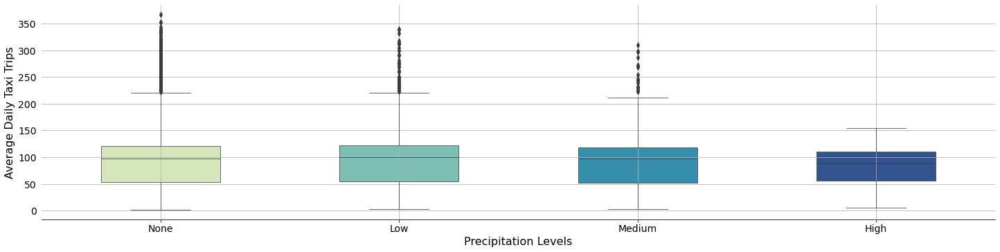

In [61]:
# Display a boxplot of average daily taxi trips vs precipitation levels
plot_boxplot(
    pickup_count_prec,
    x_var="prec",
    y_var="count",
    xlabel="Precipitation Levels",
    ylabel="Average Daily Taxi Trips",
)

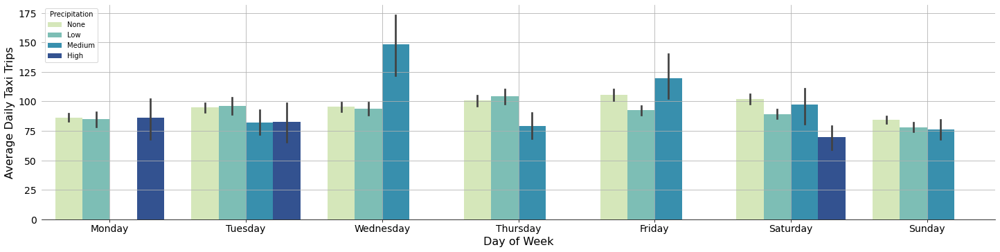

In [62]:
# Display a barplot of average daily taxi trips vs day of week for all precipitation levels
plot_barplot(
    pickup_count_prec,
    x_var="pickup_weekday",
    y_var="count",
    labels="prec",
    xlabel="Day of Week",
    ylabel="Average Daily Taxi Trips",
    legend="Precipitation",
)

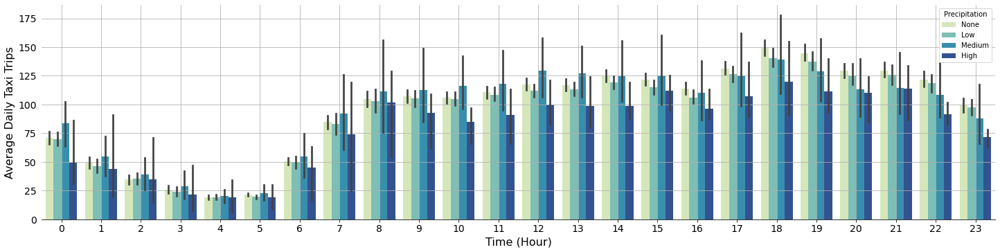

In [63]:
# Display a barplot of average daily taxi trips vs hour of day for all precipitation levels
plot_barplot(
    pickup_count_prec,
    x_var="pickup_hour",
    y_var="count",
    labels="prec",
    xlabel="Time (Hour)",
    ylabel="Average Daily Taxi Trips",
    legend="Precipitation",
)

In [64]:
# Group taxi trips by pickup year-day, week-day, hour, and precipitation levels
# Compute the mean of trip distrances and durations
pickup_avg_prec = (
    train_df.groupby(["pickup_yearday", "pickup_weekday", "pickup_hour", "prec"])
    .agg({"trip_distance": np.mean, "trip_duration": np.mean})
    .reset_index()
)

# Compute the average trip speed
pickup_avg_prec["trip_speed"] = np.divide(
    pickup_avg_prec["trip_distance"], np.divide(pickup_avg_prec["trip_duration"], 60)
)

# Replace numerical values by the name of the categories
pickup_avg_prec["prec"] = pickup_avg_prec["prec"].map(
    dict(zip(np.arange(0, 4), ["None", "Low", "Medium", "High"]))
)

# Replace numerical values by the name of the categories
pickup_avg_prec["pickup_weekday"] = pickup_avg_prec["pickup_weekday"].map(
    dict(zip(np.arange(0, 7), weekdays))
)

# Display descriptive statistics of selected columns
pickup_avg_prec[["trip_distance", "trip_duration", "trip_speed"]].describe()

,trip_distance,trip_duration,trip_speed
count,8759.000000,8759.000000,8759.000000
mean,4.548055,12.930104,21.925274
std,1.206907,2.460888,7.056311
min,1.051435,3.638889,6.160155
25%,3.767665,11.243202,16.188935
50%,4.262361,12.827083,20.352670
75%,4.979846,14.545594,26.388570
max,15.365174,28.129032,53.943748


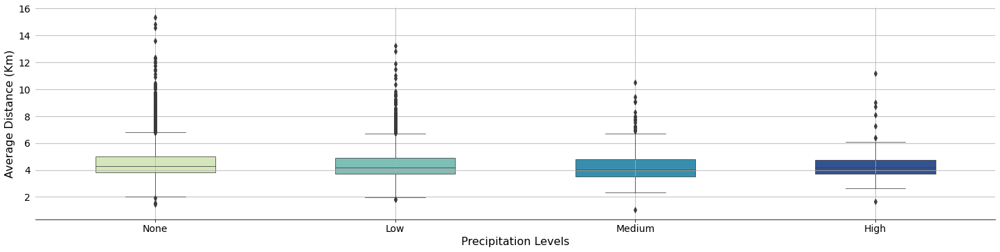

In [65]:
# Display a boxplot of average trip distance vs precipitation evels
plot_boxplot(
    pickup_avg_prec,
    x_var="prec",
    y_var="trip_distance",
    xlabel="Precipitation Levels",
    ylabel="Average Distance (Km)",
)

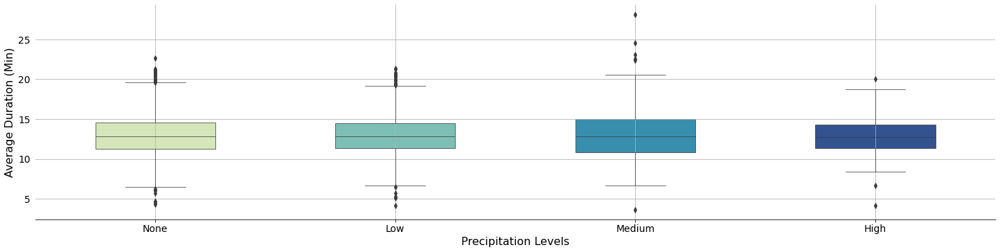

In [66]:
# Display a boxplot of average trip duration vs precipitation evels
plot_boxplot(
    pickup_avg_prec,
    x_var="prec",
    y_var="trip_duration",
    xlabel="Precipitation Levels",
    ylabel="Average Duration (Min)",
)

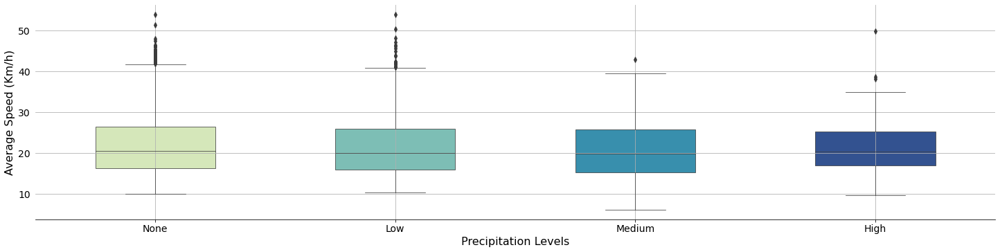

In [67]:
# Display a boxplot of average trip speed vs precipitation evels
plot_boxplot(
    pickup_avg_prec,
    x_var="prec",
    y_var="trip_speed",
    xlabel="Precipitation Levels",
    ylabel="Average Speed (Km/h)",
)

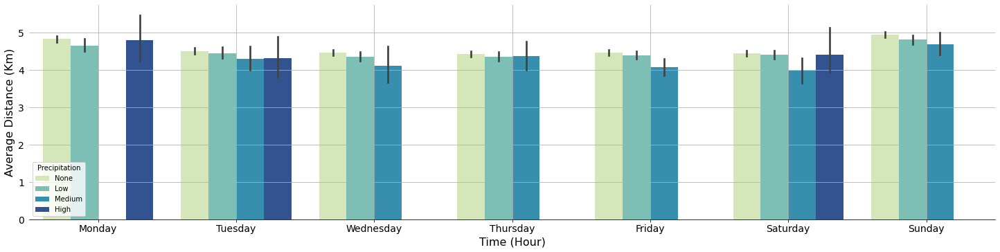

In [68]:
# Display a barplot of average trip distance vs day of week for all precipitation levels
plot_barplot(
    pickup_avg_prec,
    x_var="pickup_weekday",
    y_var="trip_distance",
    labels="prec",
    xlabel="Time (Hour)",
    ylabel="Average Distance (Km)",
    legend="Precipitation",
)

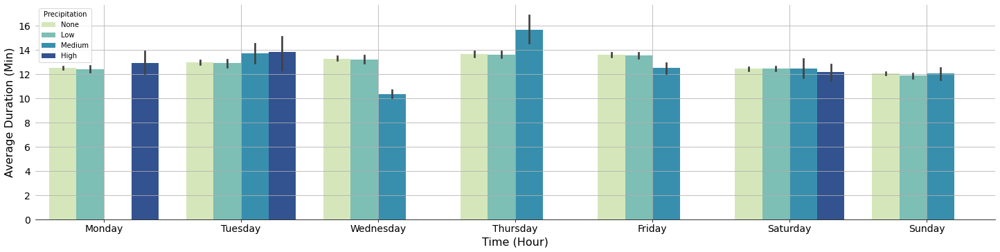

In [69]:
# Display a barplot of average trip duration vs day of week for all precipitation levels
plot_barplot(
    pickup_avg_prec,
    x_var="pickup_weekday",
    y_var="trip_duration",
    labels="prec",
    xlabel="Time (Hour)",
    ylabel="Average Duration (Min)",
    legend="Precipitation",
)

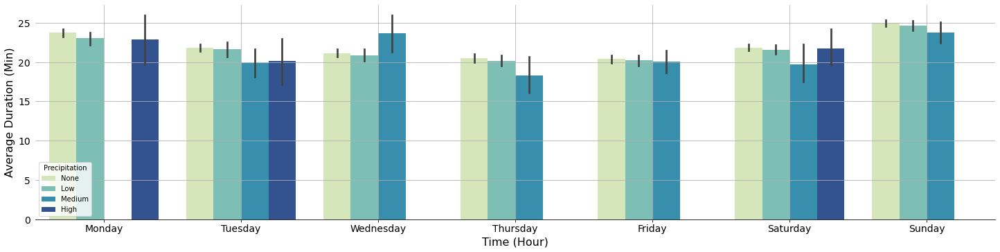

In [70]:
# Display a barplot of average trip speed vs day of week for all precipitation levels
plot_barplot(
    pickup_avg_prec,
    x_var="pickup_weekday",
    y_var="trip_speed",
    labels="prec",
    xlabel="Time (Hour)",
    ylabel="Average Duration (Min)",
    legend="Precipitation",
)

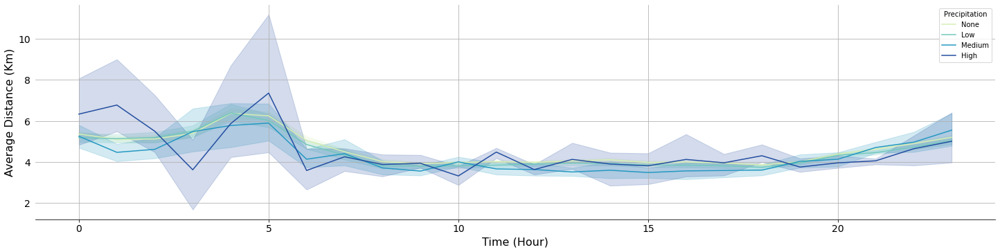

In [71]:
# Display a lineplot of average trip distance vs hour of day for all precipitation levels
plot_lineplot(
    pickup_avg_prec,
    x_var="pickup_hour",
    y_var="trip_distance",
    labels="prec",
    xlabel="Time (Hour)",
    ylabel="Average Distance (Km)",
    legend="Precipitation",
)

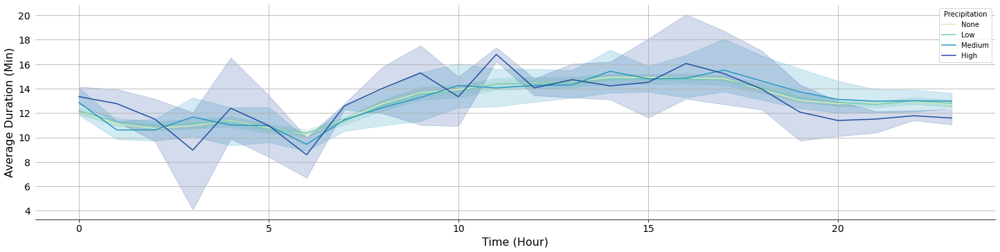

In [72]:
# Display a lineplot of average trip duration vs hour of day for all precipitation levels
plot_lineplot(
    pickup_avg_prec,
    x_var="pickup_hour",
    y_var="trip_duration",
    labels="prec",
    xlabel="Time (Hour)",
    ylabel="Average Duration (Min)",
    legend="Precipitation",
)

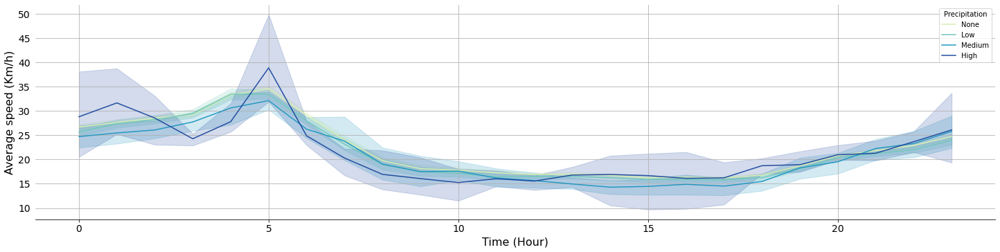

In [73]:
# Display a lineplot of average trip duration vs hour of day for all precipitation levels
plot_lineplot(
    pickup_avg_prec,
    x_var="pickup_hour",
    y_var="trip_speed",
    labels="prec",
    xlabel="Time (Hour)",
    ylabel="Average speed (Km/h)",
    legend="Precipitation",
)

In [74]:
pickup_avg_prec.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8759 entries, 0 to 8758
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   pickup_yearday  8759 non-null   int64  
 1   pickup_weekday  8759 non-null   object 
 2   pickup_hour     8759 non-null   int64  
 3   prec            8759 non-null   object 
 4   trip_distance   8759 non-null   float64
 5   trip_duration   8759 non-null   float64
 6   trip_speed      8759 non-null   float64
dtypes: float64(3), int64(2), object(2)
memory usage: 479.1+ KB


## Weather Dataset: New Snowfall

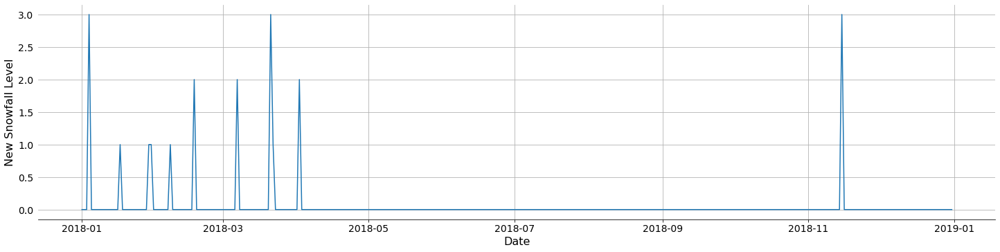

In [75]:
# Display a lineplot of new snowfall vs day of year
plot_lineplot(
    weather_df,
    x_var="date",
    y_var="new_snow",
    labels=None,
    xlabel="Date",
    ylabel="New Snowfall Level",
)

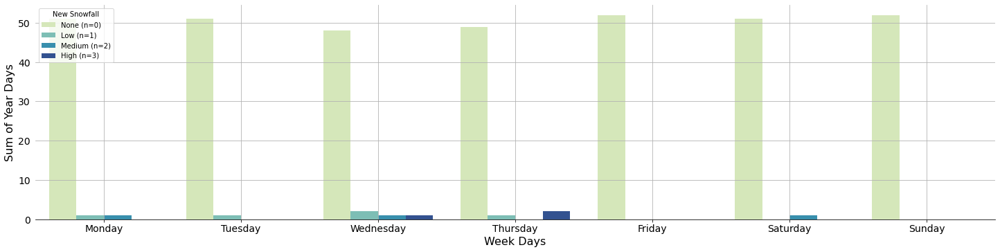

In [76]:
# Group the weather data by weekday and new snowfall levels
# Compute the number days with specific new snowfall levels
weather_count_nsnow = (
    weather_df.groupby(["weekday", "new_snow"]).size().to_frame("count").reset_index()
)

# Replace numerical values by the name of the categories
weather_count_nsnow["new_snow"] = weather_count_nsnow["new_snow"].map(
    dict(zip(np.arange(0, 4), ["None (n=0)", "Low (n=1)", "Medium (n=2)", "High (n=3)"]))
)

# Replace numerical values by the name of the categories
weather_count_nsnow["weekday"] = weather_count_nsnow["weekday"].map(
    dict(zip(np.arange(0, 7), weekdays))
)

# Display a barplot of week days vs number of year days for all new snowfall levels
plot_barplot(
    weather_count_nsnow,
    x_var="weekday",
    y_var="count",
    labels="new_snow",
    xlabel="Week Days",
    ylabel="Sum of Year Days",
    legend="New Snowfall",
)

In [77]:
# Group taxi trips by pickup year-day, week-day, hour, and new snowfall levels
# Compute the number of daily trip
pickup_count_nsnow = (
    train_df.groupby(["pickup_yearday", "pickup_weekday", "pickup_hour", "new_snow"])
    .size()
    .to_frame("count")
    .reset_index()
).sort_values(["pickup_weekday", "new_snow"])

# Replace zero counts with NaN to prevent lowering the average.
pickup_count_nsnow["count"].replace(0, np.nan, inplace=True)

# Replace numerical values by the name of the categories
pickup_count_nsnow["new_snow"] = pickup_count_nsnow["new_snow"].map(
    dict(zip(np.arange(0, 4), ["None", "Low", "Medium", "High"]))
)

# Replace numerical values by the name of the categories
pickup_count_nsnow["pickup_weekday"] = pickup_count_nsnow["pickup_weekday"].map(
    dict(zip(np.arange(0, 7), weekdays))
)

# Display the first five rows of the data frame
pickup_count_nsnow.head()

,pickup_yearday,pickup_weekday,pickup_hour,new_snow,count
0,1,Monday,0,None,119
1,1,Monday,1,None,108
2,1,Monday,2,None,112
3,1,Monday,3,None,87
4,1,Monday,4,None,52


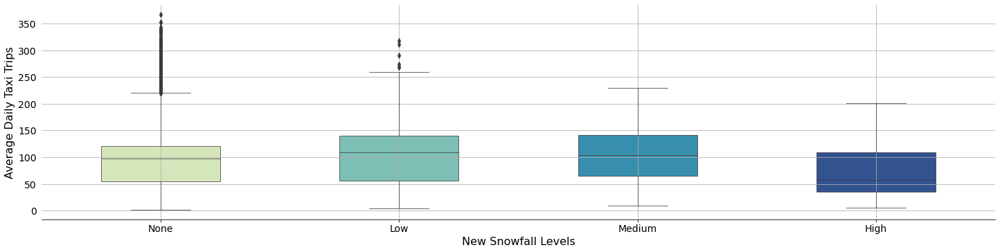

In [78]:
# Display a barplot of average daily taxi trips vs new snowfall levels
plot_boxplot(
    pickup_count_nsnow,
    x_var="new_snow",
    y_var="count",
    xlabel="New Snowfall Levels",
    ylabel="Average Daily Taxi Trips",
)

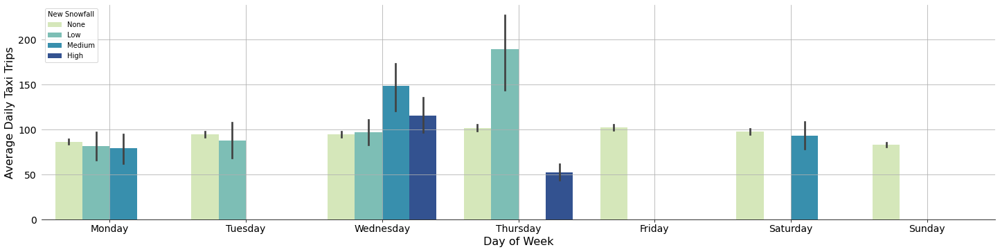

In [79]:
# Display a barplot of average daily taxi trips vs day of week for all new snowfall levels
plot_barplot(
    pickup_count_nsnow,
    x_var="pickup_weekday",
    y_var="count",
    labels="new_snow",
    label_order=["None", "Low", "Medium", "High"],
    xlabel="Day of Week",
    ylabel="Average Daily Taxi Trips",
    legend="New Snowfall",
)

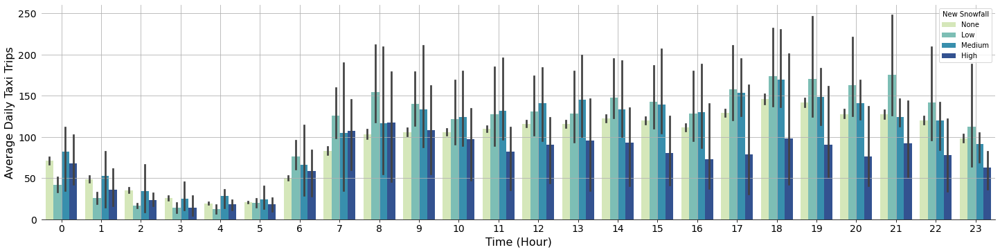

In [80]:
# Display a barplot of average daily taxi trips vs hour of day for new snowfall levels
plot_barplot(
    pickup_count_nsnow,
    x_var="pickup_hour",
    y_var="count",
    labels="new_snow",
    label_order=["None", "Low", "Medium", "High"],
    xlabel="Time (Hour)",
    ylabel="Average Daily Taxi Trips",
    legend="New Snowfall",
)

**Conclusions:** There are lots of confounding variables, including seasonal trends, annual growth due to boro taxis, and whether weather events happen to fall on weekdays or weekends, but it would appear that snowfall has a significant negative impact on daily taxi ridership:

In [81]:
# Group taxi trips by pickup year-day, week-day, hour, and new snowfall levels
# Compute the mean of trip distrances and durations
pickup_avg_nsnow = (
    train_df.groupby(["pickup_yearday", "pickup_weekday", "pickup_hour", "new_snow"])
    .agg({"trip_distance": np.mean, "trip_duration": np.mean})
    .reset_index()
).sort_values("new_snow")

# Compute the average trip speed
pickup_avg_nsnow["trip_speed"] = np.divide(
    pickup_avg_nsnow["trip_distance"], np.divide(pickup_avg_nsnow["trip_duration"], 60)
)

# Replace numerical values by the name of the categories
pickup_avg_nsnow["new_snow"] = pickup_avg_nsnow["new_snow"].map(
    dict(zip(np.arange(0, 4), ["None", "Low", "Medium", "High"]))
)

# Replace numerical values by the name of the categories
pickup_avg_nsnow["pickup_weekday"] = pickup_avg_nsnow["pickup_weekday"].map(
    dict(zip(np.arange(0, 7), weekdays))
)

# Display descriptive statistics of selected columns
pickup_avg_nsnow[["trip_distance", "trip_duration", "trip_speed"]].describe()

,trip_distance,trip_duration,trip_speed
count,8759.000000,8759.000000,8759.000000
mean,4.548055,12.930104,21.925274
std,1.206907,2.460888,7.056311
min,1.051435,3.638889,6.160155
25%,3.767665,11.243202,16.188935
50%,4.262361,12.827083,20.352670
75%,4.979846,14.545594,26.388570
max,15.365174,28.129032,53.943748


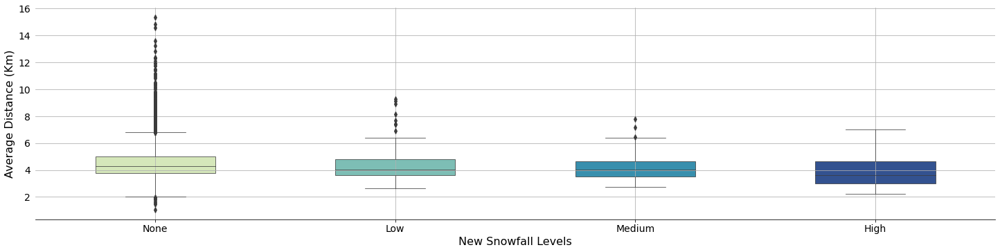

In [82]:
# Display a boxplot of average trip distance vs new snowfall levels
plot_boxplot(
    pickup_avg_nsnow,
    x_var="new_snow",
    y_var="trip_distance",
    xlabel="New Snowfall Levels",
    ylabel="Average Distance (Km)",
)


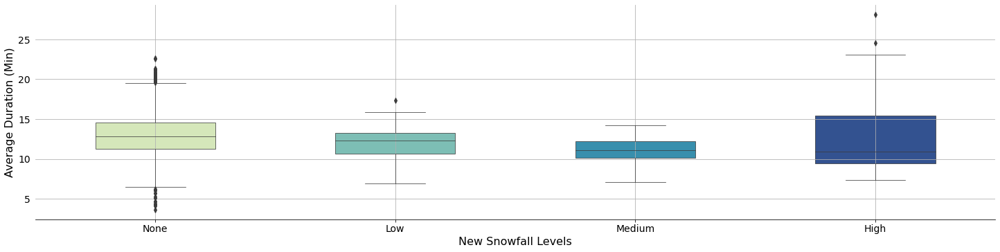

In [83]:
# Display a boxplot of average trip duration vs new snowfall levels
plot_boxplot(
    pickup_avg_nsnow,
    x_var="new_snow",
    y_var="trip_duration",
    xlabel="New Snowfall Levels",
    ylabel="Average Duration (Min)",
)

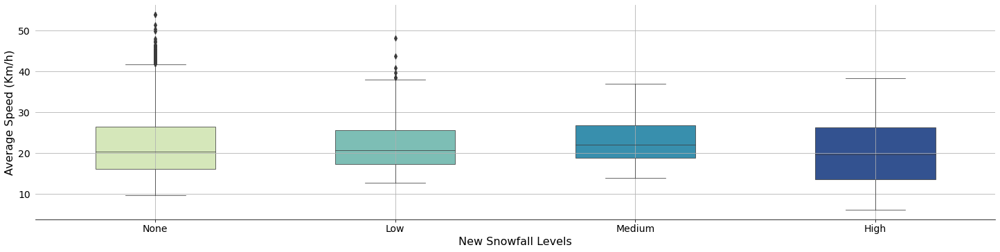

In [84]:
# Display a boxplot of average trip speed vs new snowfall levels
plot_boxplot(
    pickup_avg_nsnow,
    x_var="new_snow",
    y_var="trip_speed",
    xlabel="New Snowfall Levels",
    ylabel="Average Speed (Km/h)",
)

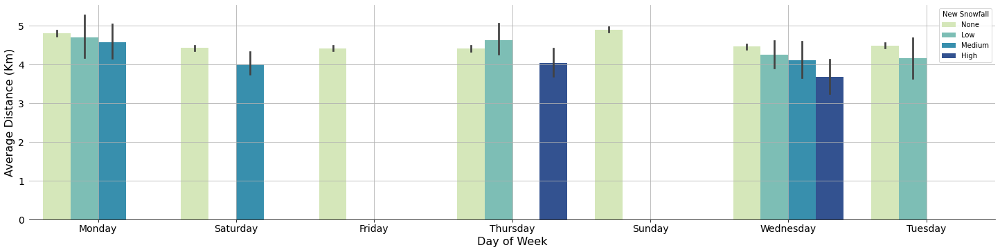

In [85]:
# Display a barplot of average trip distance vs day of week for all new snowfall levels
plot_barplot(
    pickup_avg_nsnow,
    x_var="pickup_weekday",
    y_var="trip_distance",
    labels="new_snow",
    label_order=["None", "Low", "Medium", "High"],
    xlabel="Day of Week",
    ylabel="Average Distance (Km)",
    legend="New Snowfall",
)

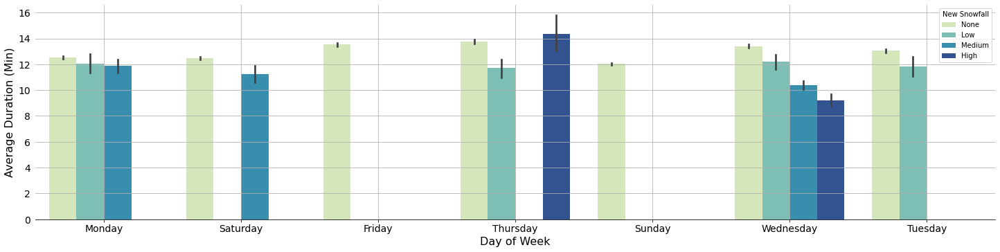

In [86]:
# Display a barplot of average trip duration vs day of week for all new snowfall levels
plot_barplot(
    pickup_avg_nsnow,
    x_var="pickup_weekday",
    y_var="trip_duration",
    labels="new_snow",
    label_order=["None", "Low", "Medium", "High"],
    xlabel="Day of Week",
    ylabel="Average Duration (Min)",
    legend="New Snowfall",
)

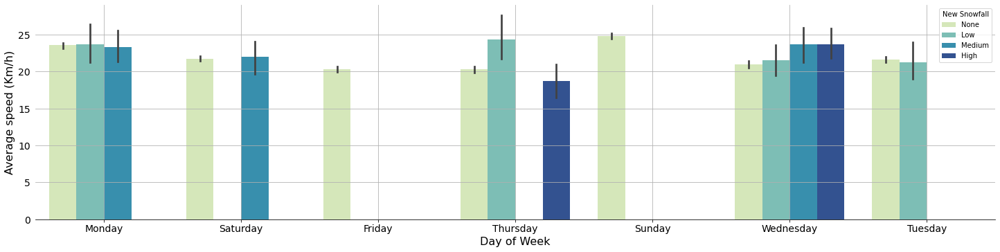

In [87]:
# Display a barplot of average trip duration vs day of week for all new snowfall levels
plot_barplot(
    pickup_avg_nsnow,
    x_var="pickup_weekday",
    y_var="trip_speed",
    labels="new_snow",
    label_order=["None", "Low", "Medium", "High"],
    xlabel="Day of Week",
    ylabel="Average speed (Km/h)",
    legend="New Snowfall",
)

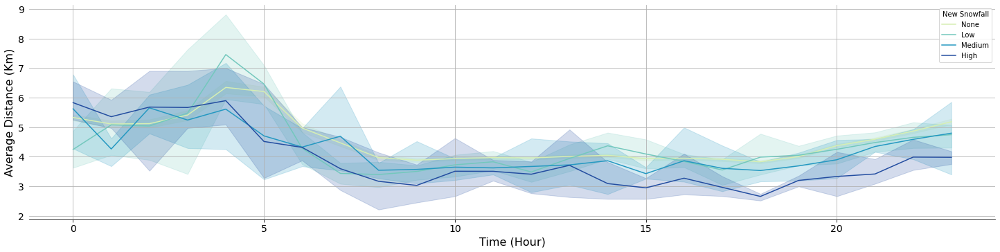

In [88]:
# Display a lineplot of average trip distance vs hour of day for all new snowfall levels
plot_lineplot(
    pickup_avg_nsnow,
    x_var="pickup_hour",
    y_var="trip_distance",
    labels="new_snow",
    label_order=["None", "Low", "Medium", "High"],
    xlabel="Time (Hour)",
    ylabel="Average Distance (Km)",
    legend="New Snowfall",
)

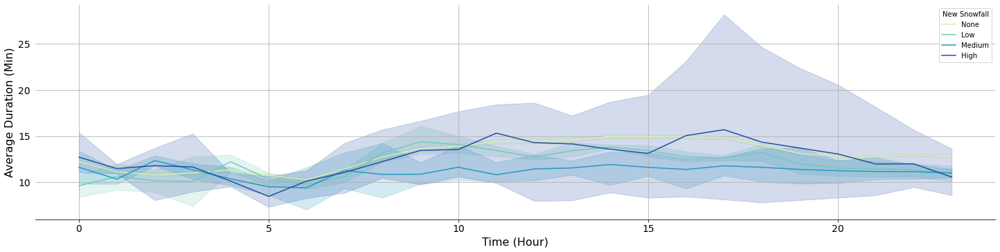

In [89]:
# Display a lineplot of average trip duration vs hour of day for all new snowfall levels
plot_lineplot(
    pickup_avg_nsnow,
    x_var="pickup_hour",
    y_var="trip_duration",
    labels="new_snow",
    label_order=["None", "Low", "Medium", "High"],
    xlabel="Time (Hour)",
    ylabel="Average Duration (Min)",
    legend="New Snowfall",
)

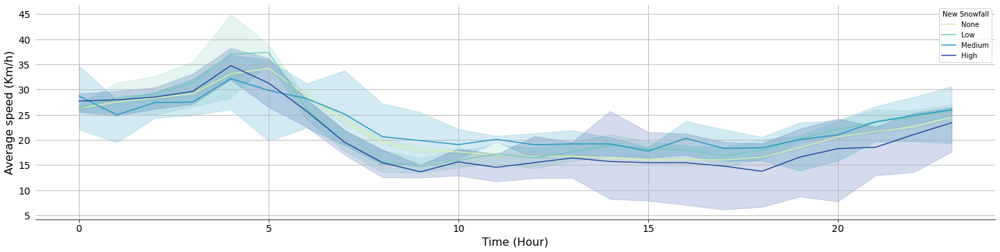

In [90]:
# Display a lineplot of average trip speed vs hour of day for all new snowfall levels
plot_lineplot(
    pickup_avg_nsnow,
    x_var="pickup_hour",
    y_var="trip_speed",
    labels="new_snow",
    label_order=["None", "Low", "Medium", "High"],
    xlabel="Time (Hour)",
    ylabel="Average speed (Km/h)",
    legend="New Snowfall",
)

## Weather Dataset: Snow Depth

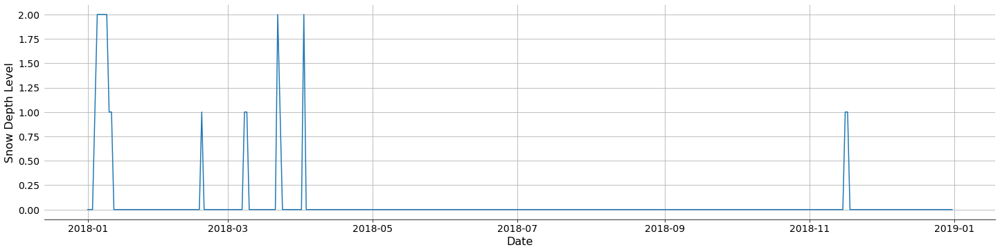

In [91]:
# Display a lineplot of snow depth vs day of year
plot_lineplot(
    weather_df,
    x_var="date",
    y_var="snow_depth",
    labels=None,
    xlabel="Date",
    ylabel="Snow Depth Level",
)

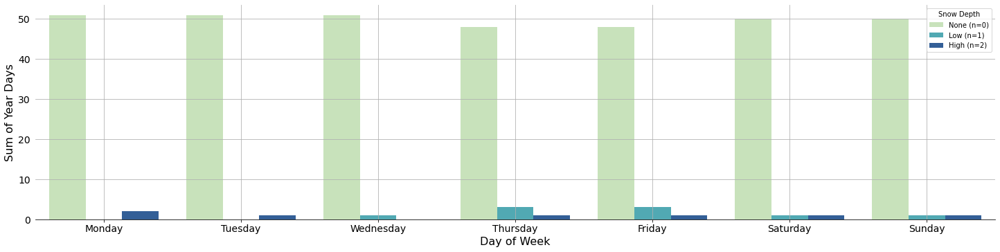

In [92]:
# Group the weather data by weekday and snow depth levels
# Compute the number days with specific snow depth levels
weather_count_temp = (
    weather_df.groupby(["weekday", "snow_depth"]).size().to_frame("count").reset_index()
)

# Replace numerical values by the name of the categories
weather_count_temp["snow_depth"] = weather_count_temp["snow_depth"].map(
    dict(zip(np.arange(0, 4), ["None (n=0)", "Low (n=1)", "High (n=2)"]))
)

# Replace numerical values by the name of the categories
weather_count_temp["weekday"] = weather_count_temp["weekday"].map(
    dict(zip(np.arange(0, 7), weekdays))
)

# Display a barplot of week days vs number of year days for all snow depth levels
plot_barplot(
    weather_count_temp,
    x_var="weekday",
    y_var="count",
    labels="snow_depth",
    xlabel="Day of Week",
    ylabel="Sum of Year Days",
    legend="Snow Depth",
    label_order=["None (n=0)", "Low (n=1)", "High (n=2)"],
)

In [93]:
# Group taxi trips by pickup year-day, week-day, hour, and snow depth levels
# Compute the number of daily trip
pickup_count_dsnow = (
    train_df.groupby(["pickup_yearday", "pickup_weekday", "pickup_hour", "snow_depth"])
    .size()
    .to_frame("count")
    .reset_index()
)

# Replace zero counts with NaN to prevent lowering the average.
pickup_count_dsnow["count"].replace(0, np.nan, inplace=True)

# Replace numerical values by the name of the categories
pickup_count_dsnow["snow_depth"] = pickup_count_dsnow["snow_depth"].map(
    dict(zip(np.arange(0, 3), ["None", "Low", "High"]))
)

# Replace numerical values by the name of the categories
pickup_count_dsnow["pickup_weekday"] = pickup_count_dsnow["pickup_weekday"].map(
    dict(zip(np.arange(0, 7), weekdays))
)

# Display the first five rows of the data frame
pickup_count_dsnow.head()

,pickup_yearday,pickup_weekday,pickup_hour,snow_depth,count
0,1,Monday,0,None,119
1,1,Monday,1,None,108
2,1,Monday,2,None,112
3,1,Monday,3,None,87
4,1,Monday,4,None,52


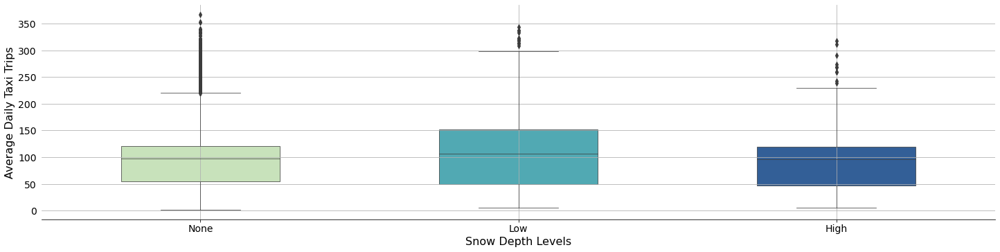

In [94]:
# Display a barplot of average daily taxi trips vs snow depth levels
plot_boxplot(
    pickup_count_dsnow,
    x_var="snow_depth",
    y_var="count",
    xlabel="Snow Depth Levels",
    ylabel="Average Daily Taxi Trips",
)

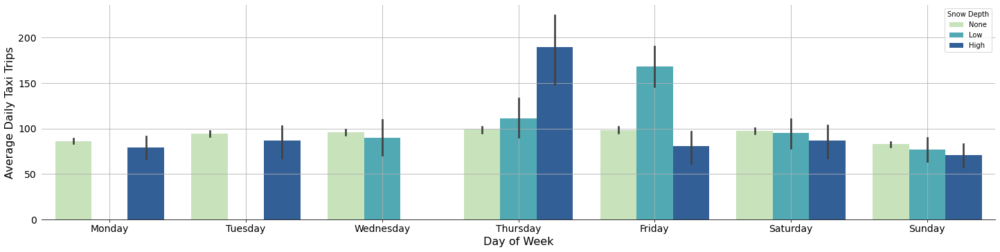

In [95]:
# Display a barplot of average daily taxi trips vs day of week for all snow depth levels
plot_barplot(
    pickup_count_dsnow,
    x_var="pickup_weekday",
    y_var="count",
    labels="snow_depth",
    xlabel="Day of Week",
    ylabel="Average Daily Taxi Trips",
    legend="Snow Depth"
)

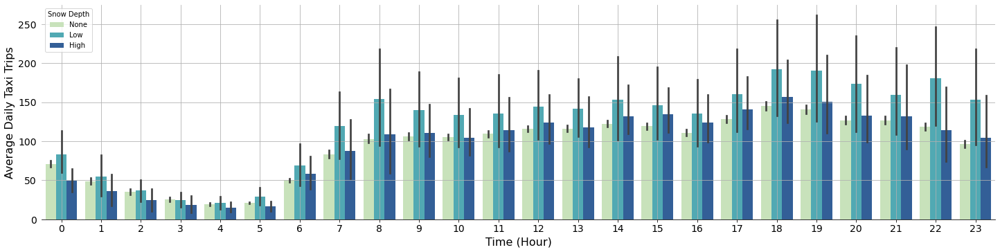

In [96]:
# Display a barplot of average daily taxi trips vs hour of day for all snow depth levels
plot_barplot(
    pickup_count_dsnow,
    x_var="pickup_hour",
    y_var="count",
    labels="snow_depth",
    xlabel="Time (Hour)",
    ylabel="Average Daily Taxi Trips",
    legend="Snow Depth"
)

In [97]:
# Group taxi trips by pickup year-day, week-day, hour, and snow depth levels
# Compute the mean of trip distrances and durations
pickup_avg_dsnow = (
    train_df.groupby(["pickup_yearday", "pickup_weekday", "pickup_hour", "snow_depth"])
    .agg({"trip_distance": np.mean, "trip_duration": np.mean})
    .reset_index()
)

# Compute the average trip speed
pickup_avg_dsnow["trip_speed"] = np.divide(
    pickup_avg_dsnow["trip_distance"], np.divide(pickup_avg_dsnow["trip_duration"], 60)
)

# Replace numerical values by the name of the categories
pickup_avg_dsnow["snow_depth"] = pickup_avg_dsnow["snow_depth"].map(
    dict(zip(np.arange(0, 3), ["None", "Low", "High"]))
)

# Replace numerical values by the name of the categories
pickup_avg_dsnow["pickup_weekday"] = pickup_avg_dsnow["pickup_weekday"].map(
    dict(zip(np.arange(0, 7), weekdays))
)

# Display descriptive statistics of selected columns
pickup_avg_dsnow[["trip_distance", "trip_duration", "trip_speed"]].describe()

,trip_distance,trip_duration,trip_speed
count,8759.000000,8759.000000,8759.000000
mean,4.548055,12.930104,21.925274
std,1.206907,2.460888,7.056311
min,1.051435,3.638889,6.160155
25%,3.767665,11.243202,16.188935
50%,4.262361,12.827083,20.352670
75%,4.979846,14.545594,26.388570
max,15.365174,28.129032,53.943748


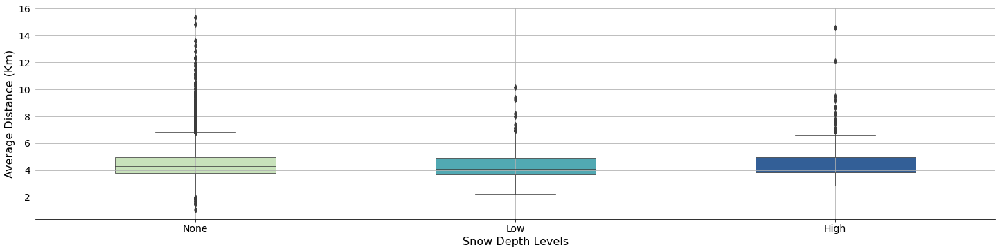

In [98]:
# Display a boxplot of average trip distance vs snow depth levels
plot_boxplot(
    pickup_avg_dsnow,
    x_var="snow_depth",
    y_var="trip_distance",
    xlabel="Snow Depth Levels",
    ylabel="Average Distance (Km)",
)

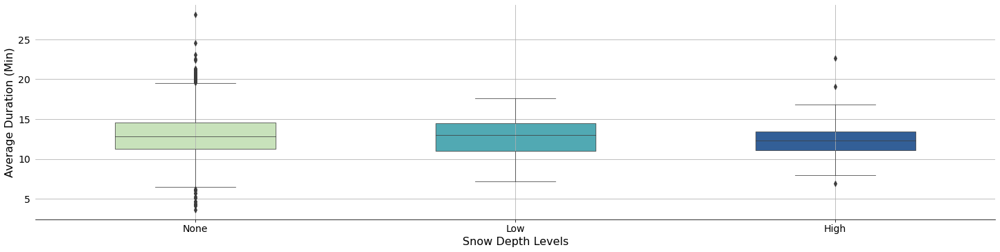

In [99]:
# Display a boxplot of average trip duration vs snow depth levels
plot_boxplot(
    pickup_avg_dsnow,
    x_var="snow_depth",
    y_var="trip_duration",
    xlabel="Snow Depth Levels",
    ylabel="Average Duration (Min)",
)

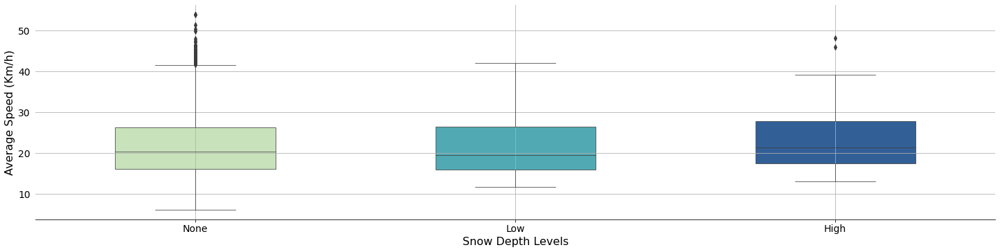

In [100]:
# Display a boxplot of average trip speed vs snow depth levels
plot_boxplot(
    pickup_avg_dsnow,
    x_var="snow_depth",
    y_var="trip_speed",
    xlabel="Snow Depth Levels",
    ylabel="Average Speed (Km/h)",
)

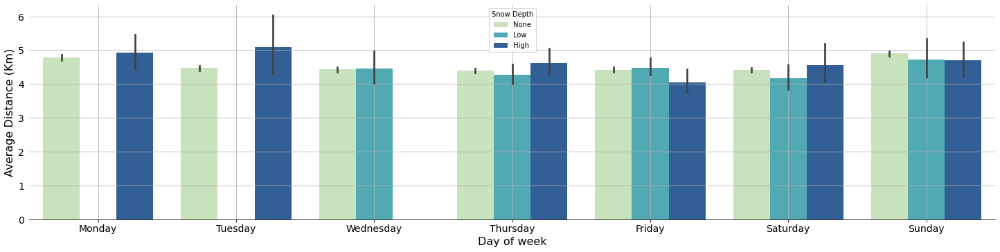

In [101]:
# Display a barplot of average trip distance vs day of week for all snow depth levels
plot_barplot(
    pickup_avg_dsnow,
    x_var="pickup_weekday",
    y_var="trip_distance",
    labels="snow_depth",
    xlabel="Day of week",
    ylabel="Average Distance (Km)",
    legend="Snow Depth",
)

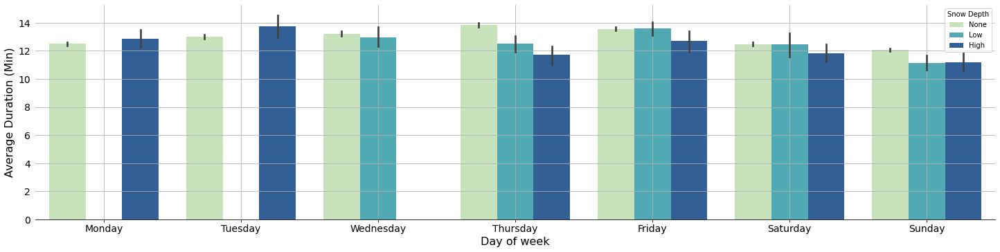

In [102]:
# Display a barplot of average trip duration vs day of week for all snow depth levels
plot_barplot(
    pickup_avg_dsnow,
    x_var="pickup_weekday",
    y_var="trip_duration",
    labels="snow_depth",
    xlabel="Day of week",
    ylabel="Average Duration (Min)",
    legend="Snow Depth",
)

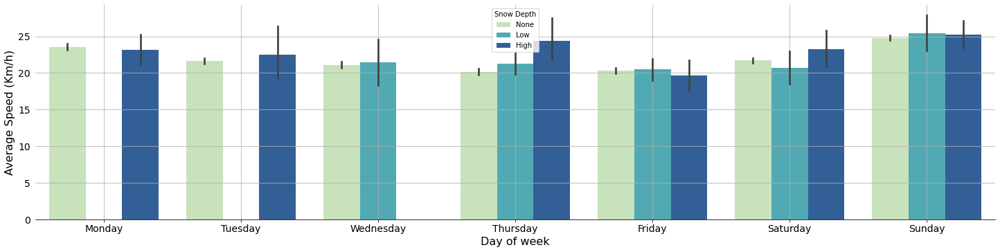

In [103]:
# Display a barplot of average trip speed vs day of week for all snow depth levels
plot_barplot(
    pickup_avg_dsnow,
    x_var="pickup_weekday",
    y_var="trip_speed",
    labels="snow_depth",
    xlabel="Day of week",
    ylabel="Average Speed (Km/h)",
    legend="Snow Depth",
)

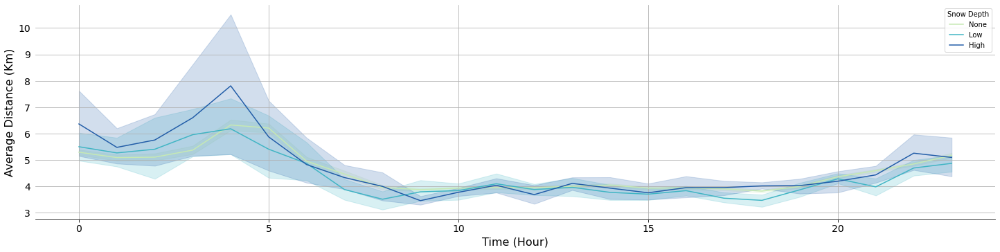

In [104]:
# Display a lineplot of average trip distance vs hour of day for all snow depth levels
plot_lineplot(
    pickup_avg_dsnow,
    x_var="pickup_hour",
    y_var="trip_distance",
    labels="snow_depth",
    xlabel="Time (Hour)",
    ylabel="Average Distance (Km)",
    legend="Snow Depth",
)

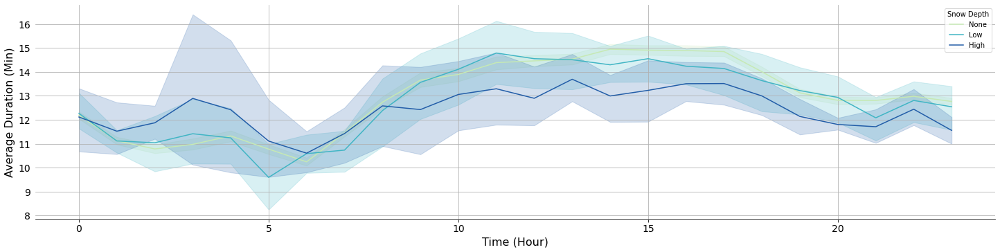

In [105]:
# Display a lineplot of average trip duration vs hour of day for all snow depth levels
plot_lineplot(
    pickup_avg_dsnow,
    x_var="pickup_hour",
    y_var="trip_duration",
    labels="snow_depth",
    xlabel="Time (Hour)",
    ylabel="Average Duration (Min)",
    legend="Snow Depth",
)

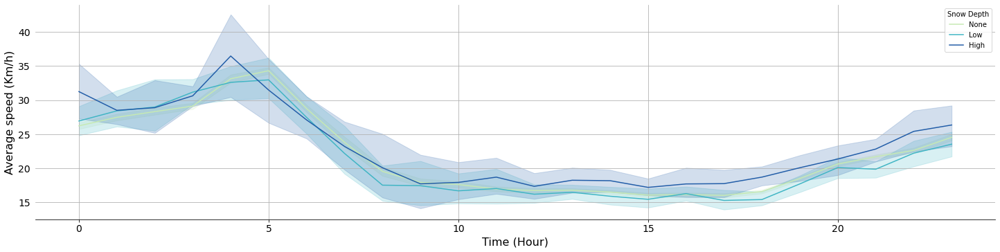

In [106]:
# Display a lineplot of average trip duration vs hour of day for all now depth levels
plot_lineplot(
    pickup_avg_dsnow,
    x_var="pickup_hour",
    y_var="trip_speed",
    labels="snow_depth",
    xlabel="Time (Hour)",
    ylabel="Average speed (Km/h)",
    legend="Snow Depth",
)

## Holidays Dataset:

In [107]:
holidays_type = [
    "Not A Public Holiday",
    "School Holiday",
    "Government Holiday",
    "Federal Holiday",
]

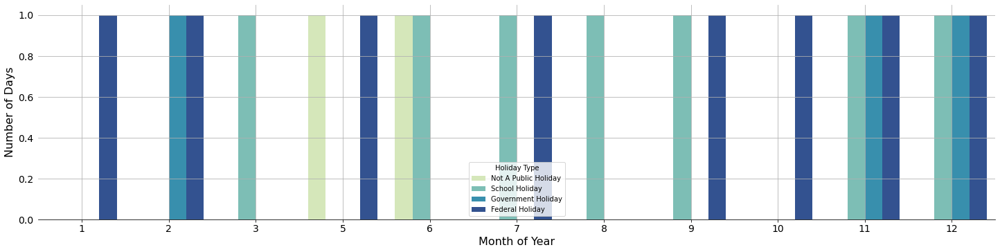

In [108]:
# Group the weather data by weekday and average temperature
# Compute the number days with specific average temperatures levels
holidays_count_viz = (
    holidays_df.groupby(["holiday_type", "holiday_date"])
    .size()
    .to_frame("count")
    .reset_index()
)

# Add a month column to the data frame
holidays_count_viz["month"] = holidays_count_viz["holiday_date"].dt.month

# Add a month column to the data frame
holidays_count_viz["weekday"] = holidays_count_viz["holiday_date"].dt.dayofweek

# Replace numerical values by the name of the categories
holidays_count_viz["holiday_type"] = holidays_count_viz["holiday_type"].map(
    dict(
        zip(
            np.arange(0, 4),
            [
                "Not A Public Holiday",
                "School Holiday",
                "Government Holiday",
                "Federal Holiday",
            ],
        )
    )
)

# Display a barplot of average trip speed vs day of week for all snow depth levels
plot_barplot(
    holidays_count_viz,
    x_var="month",
    y_var="count",
    labels="holiday_type",
    xlabel="Month of Year",
    ylabel="Number of Days",
    legend="Holiday Type",
)

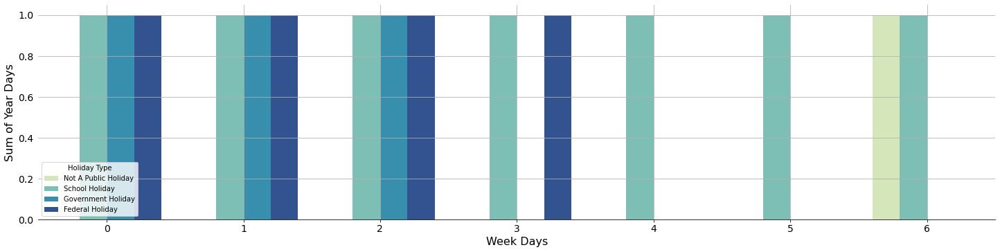

In [109]:
# Display a barplot of week days vs number of year days for all temperature levels
plot_barplot(
    holidays_count_viz,
    x_var="weekday",
    y_var="count",
    labels="holiday_type",
    xlabel="Week Days",
    ylabel="Sum of Year Days",
    legend="Holiday Type",
)

In [110]:
# Group taxi trips by pickup year-day, week-day, hour, and average temperature
# Compute the number of daily trip
pickup_count_holidays = (
    train_df.groupby(
        ["pickup_yearday", "pickup_weekday", "pickup_hour", "holiday", "holiday_type"]
    )
    .size()
    .to_frame("count")
    .reset_index()
).sort_values(["holiday_type"])

# Replace zero counts with NaN to prevent lowering the average.
pickup_count_holidays["count"].replace(0, np.nan, inplace=True)

# Replace numerical values by the name of the categories
pickup_count_holidays["holiday_type"] = pickup_count_holidays["holiday_type"].map(
    dict(
        zip(
            np.arange(0, 4),
            holidays_type,
        )
    )
)

# Replace numerical values by the name of the categories
pickup_count_holidays["pickup_weekday"] = pickup_count_holidays["pickup_weekday"].map(
    dict(zip(np.arange(0, 7), weekdays))
)

# Display the first five rows of the data frame
pickup_count_holidays.head()

,pickup_yearday,pickup_weekday,pickup_hour,holiday,holiday_type,count
4379,183,Monday,12,0.0,Not A Public Holiday,93
5397,225,Monday,22,0.0,Not A Public Holiday,92
5396,225,Monday,21,0.0,Not A Public Holiday,90
5395,225,Monday,20,0.0,Not A Public Holiday,108
5394,225,Monday,19,0.0,Not A Public Holiday,110


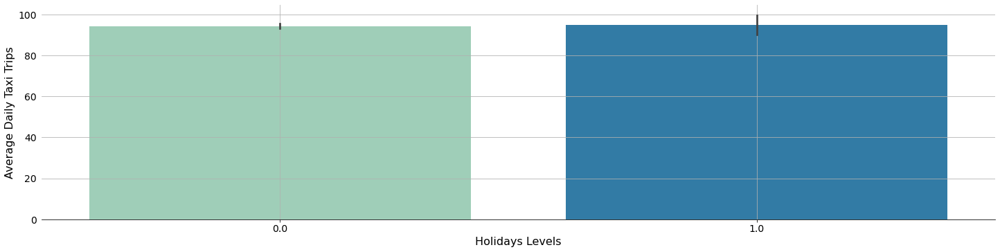

In [111]:
# Display a barplot of average daily taxi trips vs snow depth levels
plot_barplot(
    pickup_count_holidays,
    x_var="holiday",
    y_var="count",
    labels=None,
    xlabel="Holidays Levels",
    ylabel="Average Daily Taxi Trips",
)

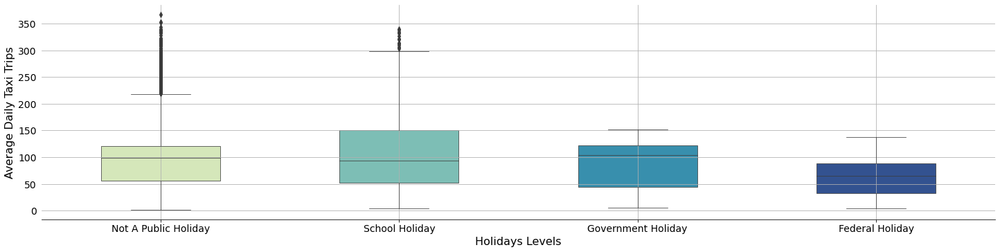

In [112]:
# Display a barplot of average daily taxi trips vs snow depth levels
plot_boxplot(
    pickup_count_holidays,
    x_var="holiday_type",
    y_var="count",
    xlabel="Holidays Levels",
    ylabel="Average Daily Taxi Trips",
)

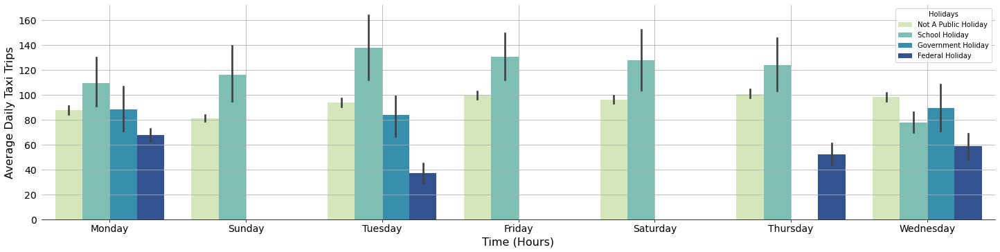

In [113]:
# Display a barplot of average daily taxi trips vs hour of day for all average temperature levels
plot_barplot(
    pickup_count_holidays,
    x_var="pickup_weekday",
    y_var="count",
    labels="holiday_type",
    xlabel="Time (Hours)",
    ylabel="Average Daily Taxi Trips",
    legend="Holidays"
)

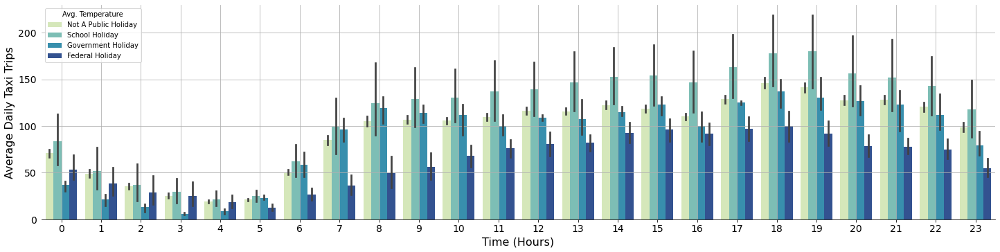

In [114]:
# Display a barplot of average daily taxi trips vs hour of day for all average temperature levels
plot_barplot(
    pickup_count_holidays,
    x_var="pickup_hour",
    y_var="count",
    labels="holiday_type",
    xlabel="Time (Hours)",
    ylabel="Average Daily Taxi Trips",
    legend="Avg. Temperature"
)

In [115]:
# Group taxi trips by pickup year-day, week-day, hour, and average temperature levels
# Compute the mean of trip distrances and durations
pickup_avg_holidays = (
    train_df.groupby(
        ["pickup_yearday", "pickup_weekday", "pickup_hour", "holiday", "holiday_type"]
    )
    .agg({"trip_distance": np.mean, "trip_duration": np.mean})
    .reset_index()
).sort_values("holiday_type")

# Compute the average trip speed
pickup_avg_holidays["trip_speed"] = np.divide(
    pickup_avg_holidays["trip_distance"],
    np.divide(pickup_avg_holidays["trip_duration"], 60),
)

# Replace numerical values by the name of the categories
pickup_avg_holidays["holiday_type"] = pickup_avg_holidays["holiday_type"].map(
    dict(
        zip(
            np.arange(0, 4),
            holidays_type,
        )
    )
)

# Replace numerical values by the name of the categories
pickup_avg_holidays["pickup_weekday"] = pickup_avg_holidays["pickup_weekday"].map(
    dict(zip(np.arange(0, 7), weekdays))
)

# Display descriptive statistics of selected columns
pickup_avg_holidays[["trip_distance", "trip_duration", "trip_speed"]].describe()

,trip_distance,trip_duration,trip_speed
count,8759.000000,8759.000000,8759.000000
mean,4.548055,12.930104,21.925274
std,1.206907,2.460888,7.056311
min,1.051435,3.638889,6.160155
25%,3.767665,11.243202,16.188935
50%,4.262361,12.827083,20.352670
75%,4.979846,14.545594,26.388570
max,15.365174,28.129032,53.943748


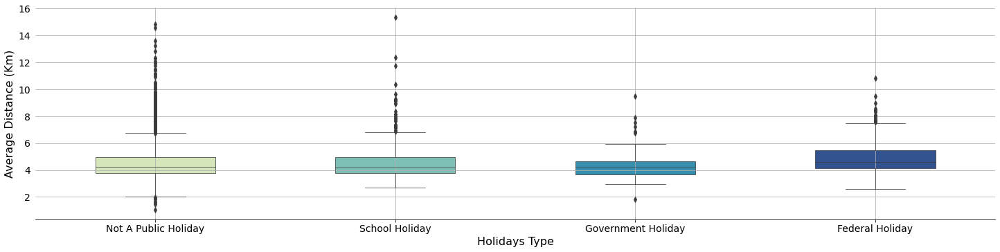

In [116]:
# Display a boxplot of average trip distance vs hour of day for all average temperature levels
plot_boxplot(
    pickup_avg_holidays,
    x_var="holiday_type",
    y_var="trip_distance",
    xlabel="Holidays Type",
    ylabel="Average Distance (Km)",
)

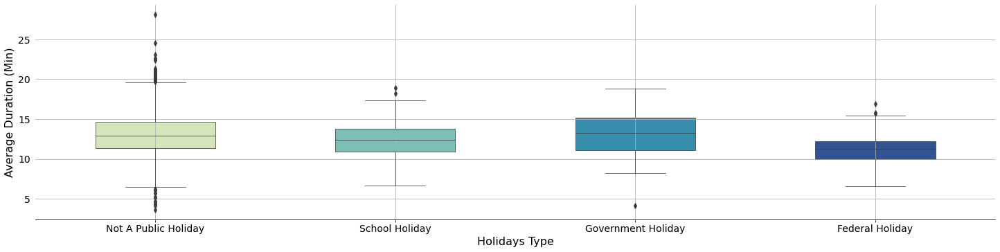

In [117]:
# Display a boxplot of average trip duration vs hour of day for all average temperature levels
plot_boxplot(
    pickup_avg_holidays,
    x_var="holiday_type",
    y_var="trip_duration",
    xlabel="Holidays Type",
    ylabel="Average Duration (Min)",
)

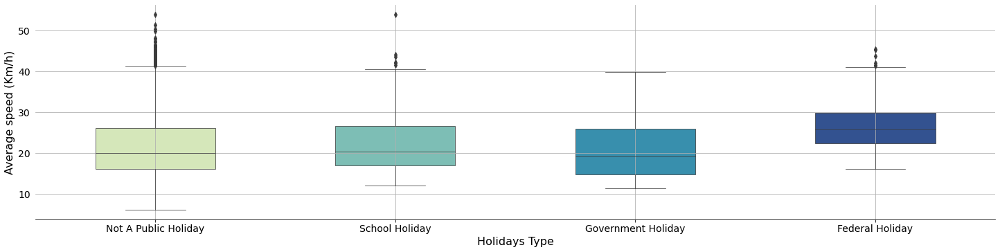

In [118]:
# Display a boxplot of average trip duration vs types of holidays
plot_boxplot(
    pickup_avg_holidays,
    x_var="holiday_type",
    y_var="trip_speed",
    xlabel="Holidays Type",
    ylabel="Average speed (Km/h)",
)

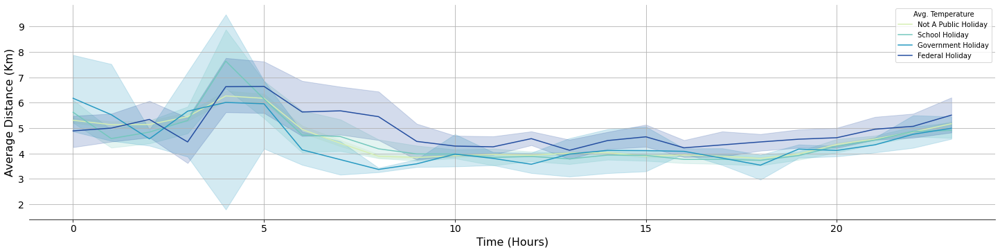

In [119]:
# Display a lineplot of average trip distance vs hour of day for all types of holidays
plot_lineplot(
    pickup_avg_holidays,
    x_var="pickup_hour",
    y_var="trip_distance",
    labels="holiday_type",
    xlabel="Time (Hours)",
    ylabel="Average Distance (Km)",
    legend="Avg. Temperature"
)

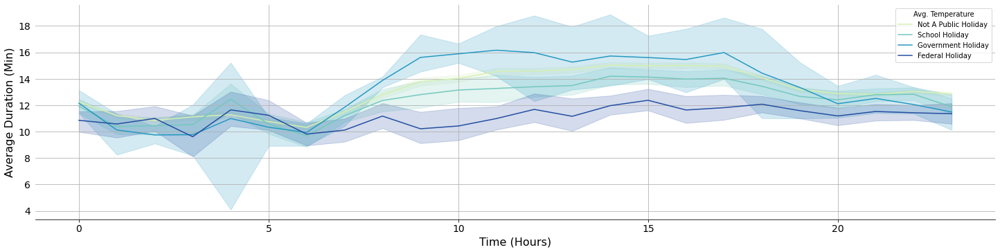

In [120]:
# Display a lineplot of average trip duration vs hour of day for all types of holidays
plot_lineplot(
    pickup_avg_holidays,
    x_var="pickup_hour",
    y_var="trip_duration",
    labels="holiday_type",
    xlabel="Time (Hours)",
    ylabel="Average Duration (Min)",
    legend="Avg. Temperature"
)

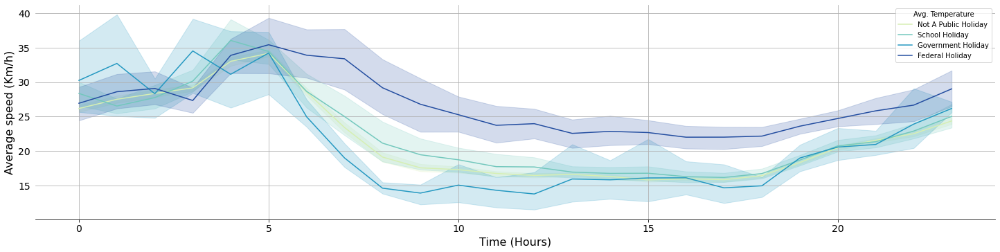

In [121]:
# Display a lineplot of average trip duration vs hour of day for all types of holidays
plot_lineplot(
    pickup_avg_holidays,
    x_var="pickup_hour",
    y_var="trip_speed",
    labels="holiday_type",
    xlabel="Time (Hours)",
    ylabel="Average speed (Km/h)",
    legend="Avg. Temperature"
)

## Features Coorelation

In [122]:
# Display a heatmap of the correlation matrix for all features of the data frame
plot_corrmap(weather_subset_enc.corr())

NameError: name 'weather_subset_enc' is not defined

One-hot encoding is a common transformation for features that have non-linear relationships with the target to add more flexibility to linear models. So, applying one-hot encoding to discrete features can be beneficial in some cases. For continuous features that don't have a linear relationship with the target, you can experiment with polynomial features. Another approach would be to first "bin" the continuous feature (for example, using the pandas.qcut() function) and then apply one-hot encoding. Applying one-hot encoding to a (discrete or binned) feature will split the variable into several (binary) features that can take 0 or 1 values. In this case, a linear model will predict a constant value for each of these binary features, which corresponds to each (binary) feature's mean target value.

If there is no natural ordering in the categorical feature, you can one-hot encode this feature. If the feature has a natural ordering

In [ ]:
# Get a subset of the data frame with trip duration, and weather and holidays columns
weather_subset = train_df[
    ["avg_temp", "prec", "new_snow", "snow_depth", "holiday_type","trip_duration"]
]

# One-Hot encode selected columns of the subset data frame
weather_subset_enc = pd.get_dummies(
    weather_subset, columns=["avg_temp", "prec", "new_snow", "snow_depth", "holiday_type"]
)

# Display a heatmap of the correlation matrix of one-hot encoded all features of the data frame
plot_corrmap(weather_subset_enc.corr())

In [ ]:
https://towardsdatascience.com/one-hot-encoding-is-making-your-tree-based-ensembles-worse-heres-why-d64b282b5769

***
## Data Export